In [1]:
import os
os.environ["CC"] = "gcc"
os.environ["CXX"] = "gcc"
import sys
sys.path.append('/usr/lib/python3/dist-packages')
print(sys.path)
import os
os.environ["OMP_PROC_BIND"] = os.environ.get("OMP_PROC_BIND", "true")

import numpy as np
import matplotlib.pyplot as plt
import scipy.interpolate
%matplotlib inline

from pix_transform.pix_transform import PixTransform
from baselines.baselines import bicubic
from utils.utils import downsample,align_images
from prox_tv import tvgen
from utils.plots import plot_result

import imageio
import torch
torch.cuda.empty_cache()

['/home/beast2020/Desktop/mingchi/PixTransform-save_params', '/home/beast2020/anaconda3/lib/python38.zip', '/home/beast2020/anaconda3/lib/python3.8', '/home/beast2020/anaconda3/lib/python3.8/lib-dynload', '', '/home/beast2020/.local/lib/python3.8/site-packages', '/home/beast2020/anaconda3/lib/python3.8/site-packages', '/home/beast2020/.local/lib/python3.8/site-packages/IPython/extensions', '/home/beast2020/.ipython', '/usr/lib/python3/dist-packages']


## EPFL oblique

In [2]:
current_dir = os.getcwd()
direct = os.path.abspath(os.path.join(current_dir, os.pardir))
directory = direct +'/Data_preprocessing'

'/home/beast2020/Desktop/mingchi'

In [3]:
rgb_dir = directory+'/EPFL_oblique/rgb/'
_files = os.listdir(rgb_dir)
_files.sort()
_rgb_files = [rgb_dir + f for f in _files]
_rgb_files.sort()
print(len(_rgb_files))

dist_dir = directory+'/EPFL_oblique/dist/'
_files = os.listdir(dist_dir)
_files.sort()
_dist_files = [dist_dir + f for f in _files]
_dist_files.sort()
print(len(_dist_files))

25
25


In [4]:
guide_imgs = []
target_imgs= []

for num in range(len(_rgb_files)):
    rgb_img = imageio.imread(_rgb_files[num])
    guide_imgs.append(rgb_img)
    dist_img = torch.load(_dist_files[num])
    dist_img = dist_img.detach().cpu().numpy()
    target_imgs.append(dist_img)
        
guide_imgs = np.asarray(guide_imgs)
guide_imgs = np.einsum('ijkl->iljk', guide_imgs)        
target_imgs = np.asarray(target_imgs)

In [5]:
print(guide_imgs.shape)
print('max value in the image is: ' + str(guide_imgs.max()))
print('min value in the image is: ' + str(guide_imgs.min()))

(25, 3, 480, 720)
max value in the image is: 255
min value in the image is: 0


In [6]:
print(target_imgs.shape)
print('max value in the image is: ' + str(target_imgs.max()))
print('min value in the image is: ' + str(target_imgs.min()))

(25, 480, 720)
max value in the image is: 293.36646
min value in the image is: 70.43551


### Change upsampling to 40

In [7]:
torch.cuda.empty_cache()

####### image 1/25 - image idx 0 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[317.24304     6.1002197   5.1119685   3.9919028   4.012656    3.901011
   4.709217    3.9384801   3.969888    3.9007237   4.1098757   3.9654558
   4.090536    4.059556    3.706148    4.264409 ]
----------MAE----------
(16,)
[13.488869   1.8185413  1.4683166  1.3008562  1.2294033  1.2426554
  1.3715134  1.2228159  1.1830124  1.191778   1.3537096  1.2287066
  1.2849122  1.2497722  1.160717   1.2689399]


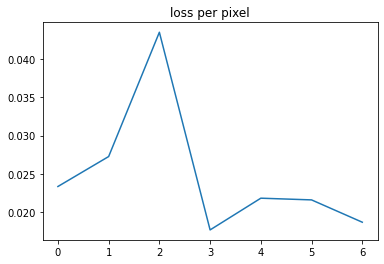

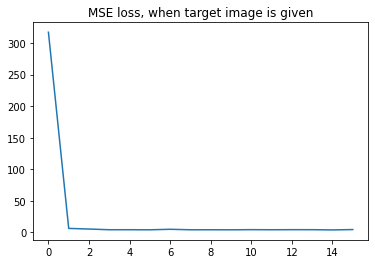

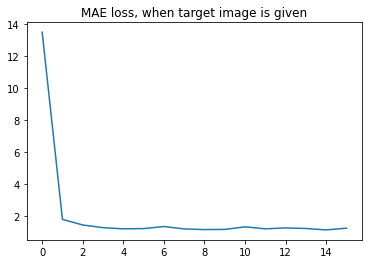

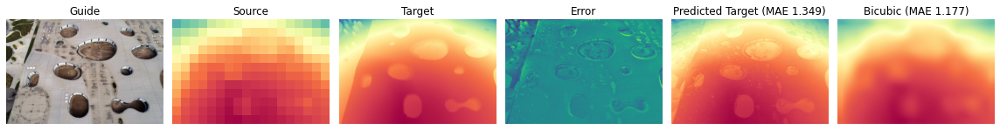

MSE: 4.156  ---  MAE: 1.349  ---  PBP: 0.445



####### image 2/25 - image idx 1 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[285.75662     5.3406496   4.360639    4.8510394   4.437117    4.111688
   4.8717065   3.672453    3.9586456   3.6017606   3.8120832   3.6503031
   3.703439    3.6886408   3.5613108   3.472457 ]
----------MAE----------
(16,)
[12.607654   1.4779713  1.3345376  1.5028021  1.3643043  1.2802228
  1.4979422  1.1862851  1.258981   1.186339   1.2082218  1.1705227
  1.1769506  1.2243516  1.1801529  1.1436913]


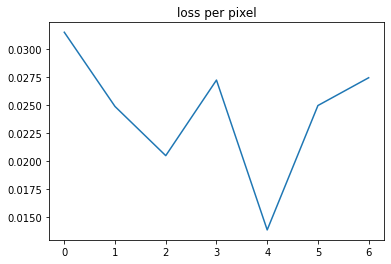

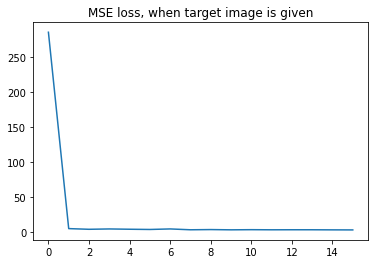

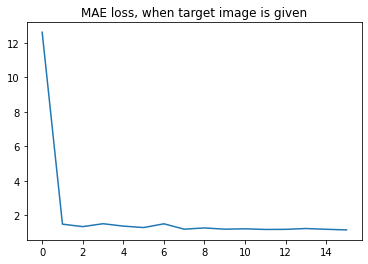

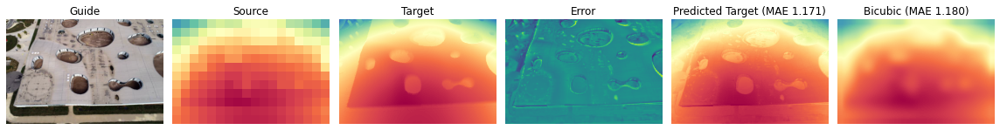

MSE: 3.619  ---  MAE: 1.171  ---  PBP: 0.339



####### image 3/25 - image idx 2 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[350.7652      4.4782233   4.453363    5.319964    4.1749907   4.640387
   3.8423452   3.7670844   5.3209248   4.1413407   4.0910645   3.4912922
   3.729909    3.5492861   3.6559193   3.471907 ]
----------MAE----------
(16,)
[13.617045   1.3993212  1.3996204  1.5755483  1.2514812  1.4749893
  1.1823545  1.1482571  1.5886083  1.3830402  1.228039   1.0861716
  1.1451519  1.166089   1.1390371  1.0978897]


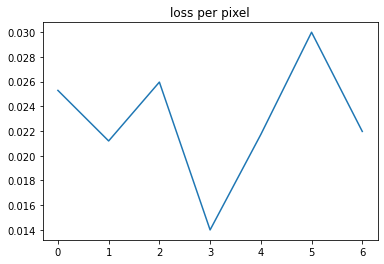

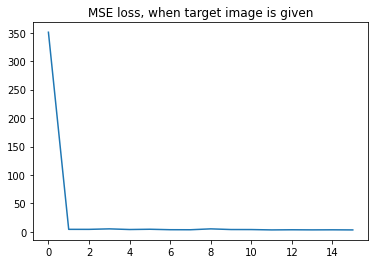

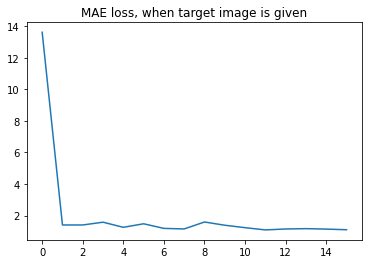

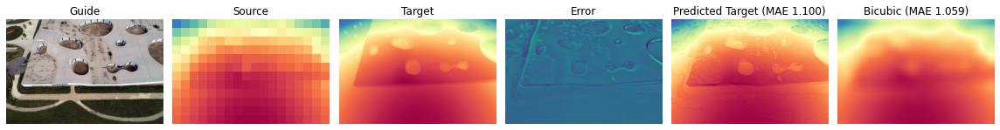

MSE: 3.647  ---  MAE: 1.100  ---  PBP: 0.305



####### image 4/25 - image idx 3 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[267.4973     19.973513   14.073346   14.199926   14.704832   16.08353
  13.926493   14.56825    15.745509   14.465943   16.444496   15.853122
  17.377548   17.184233   15.5058155  15.158337 ]
----------MAE----------
(16,)
[12.079758   2.9086204  2.4317412  2.4233184  2.482792   2.6718042
  2.342525   2.3317893  2.4360561  2.3391027  2.4351752  2.4874523
  2.5697272  2.4713576  2.3675466  2.3040242]


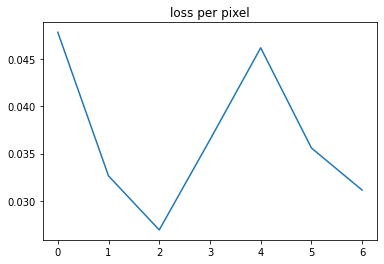

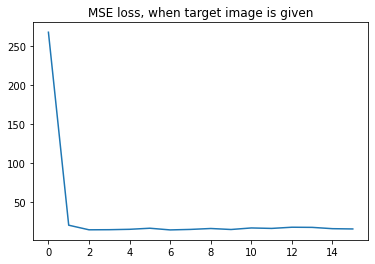

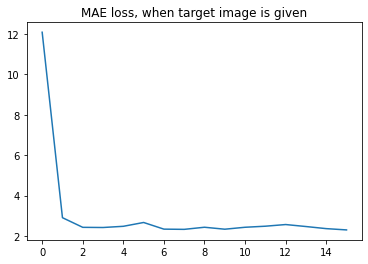

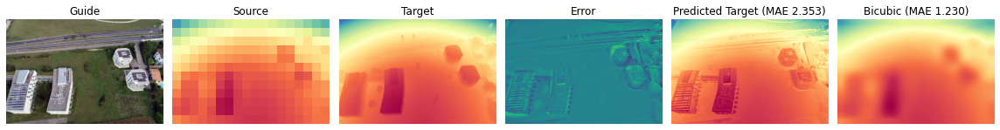

MSE: 15.501  ---  MAE: 2.353  ---  PBP: 0.503



####### image 5/25 - image idx 4 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[316.29547   17.227257  15.498854  15.311467  15.051574  13.39881
  13.064976  15.297289  14.073992  14.15294   15.213165  14.119608
  15.127762  15.652833  14.715014  15.081467]
----------MAE----------
(16,)
[14.263727   2.76409    2.5207102  2.717464   2.5518901  2.3093352
  2.2702594  2.4276128  2.4286513  2.3454728  2.5711951  2.3279486
  2.459732   2.4949682  2.4264855  2.4576008]


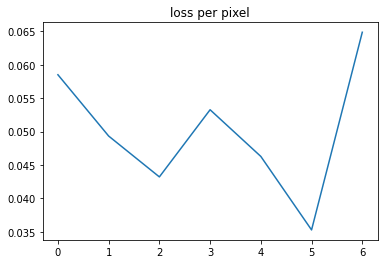

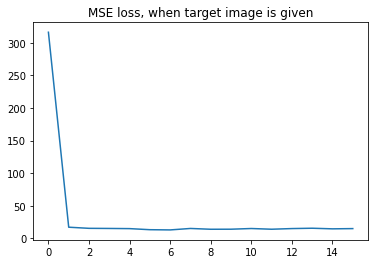

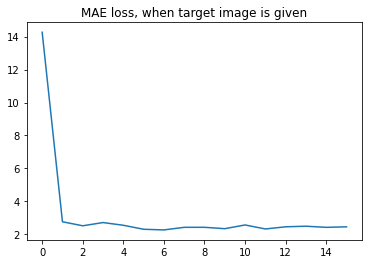

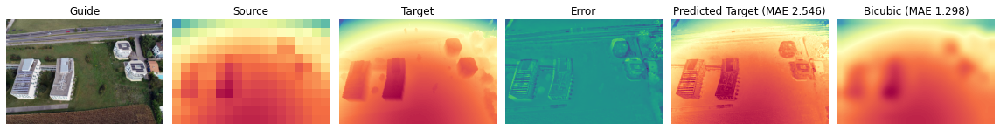

MSE: 15.984  ---  MAE: 2.546  ---  PBP: 0.632



####### image 6/25 - image idx 5 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[290.5731    13.507899  12.634944  11.103505  11.654203  11.81318
  11.220411  10.940903  10.808329  10.678868  10.022041  10.073441
  10.226193   9.719666  10.897021   9.826334]
----------MAE----------
(16,)
[12.847947   2.360216   2.2455122  2.0713582  2.1880553  2.1004822
  2.2190912  2.1247797  2.0033784  1.989809   1.9659523  1.9100108
  1.9636079  1.9115567  2.1846247  1.9192585]


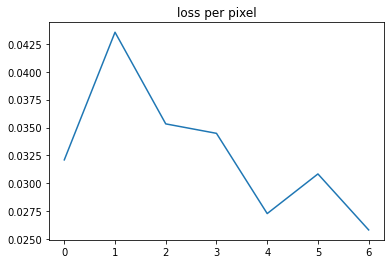

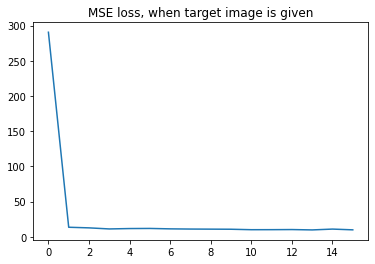

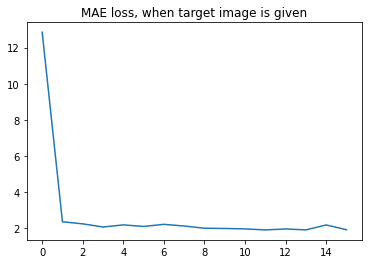

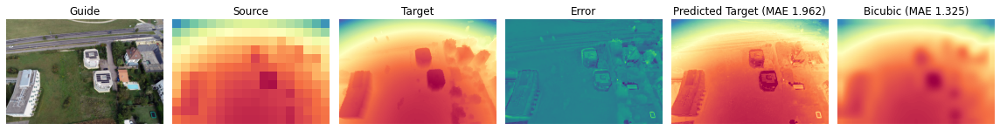

MSE: 10.160  ---  MAE: 1.962  ---  PBP: 0.531



####### image 7/25 - image idx 6 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[338.6251      8.814774    7.56685     7.1725855   8.309758    8.097235
   6.32713     6.6759114   6.525652    6.254872    6.7921576   5.8982987
   6.0403237   6.1003284   5.6997485   6.2970777]
----------MAE----------
(16,)
[14.17943    2.014749   1.8340144  1.6859564  1.8946408  1.9397326
  1.5909762  1.5310549  1.6708364  1.7166424  1.6707324  1.4415587
  1.5069649  1.614018   1.4502977  1.534328 ]


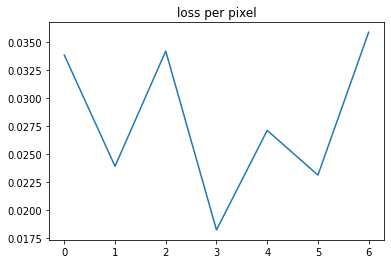

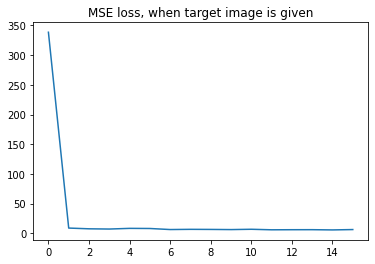

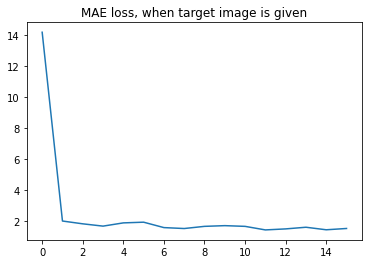

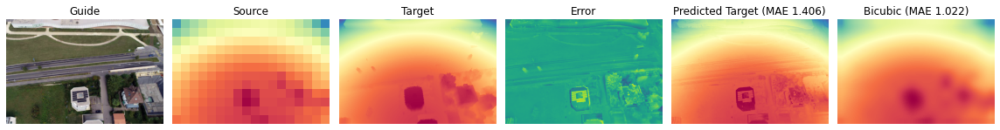

MSE: 5.048  ---  MAE: 1.406  ---  PBP: 0.421



####### image 8/25 - image idx 7 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[316.87772     7.4082084   5.5885944   5.022246    6.515495    4.878405
   5.386305    5.0289707   5.0819483   4.272993    4.2324915   4.451895
   4.6413493   4.4375143   4.248386    4.440468 ]
----------MAE----------
(16,)
[13.500397   1.792419   1.3441616  1.2153007  1.4743404  1.1830719
  1.40353    1.2281213  1.298826   1.1274858  1.0953183  1.2120129
  1.1697243  1.1828742  1.1676705  1.154455 ]


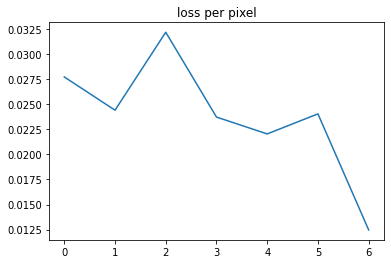

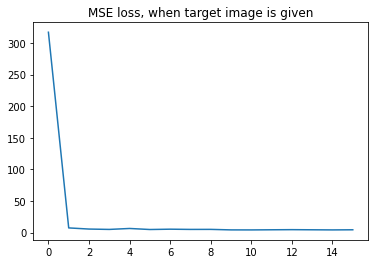

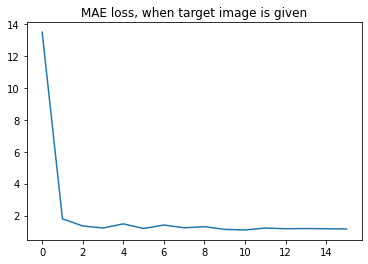

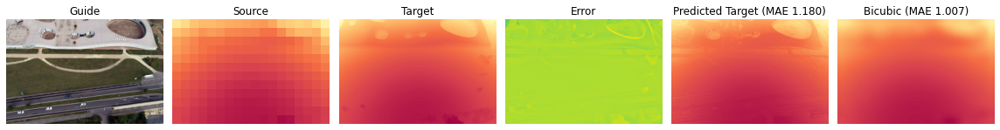

MSE: 4.602  ---  MAE: 1.180  ---  PBP: 0.352



####### image 9/25 - image idx 8 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[342.7468      5.360712    5.555283    4.6983204   4.640641    4.571161
   4.622511    4.336248    4.2066593   4.529277    5.977781    4.219284
   4.1092114   4.3388114   3.9070964   4.185783 ]
----------MAE----------
(16,)
[13.60353    1.5314721  1.3546437  1.1125952  1.2727098  1.2336271
  1.1618694  1.1933371  1.0896902  1.2309318  1.352021   1.0508474
  1.0313708  1.2031007  1.0509467  1.1622369]


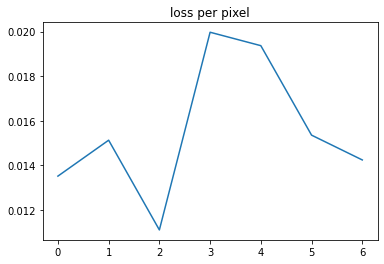

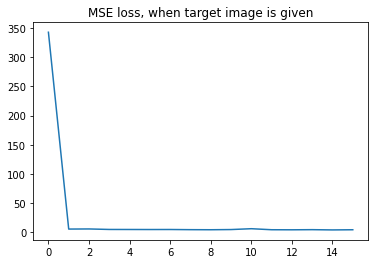

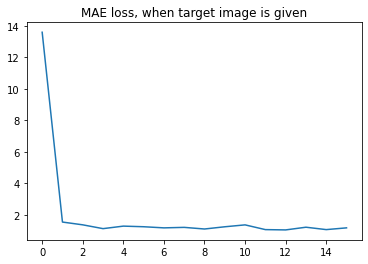

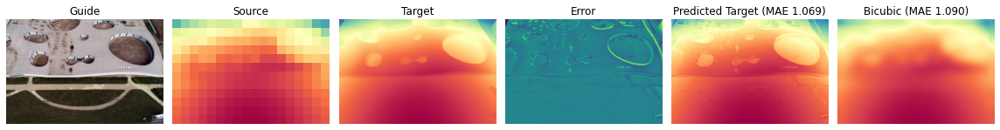

MSE: 4.115  ---  MAE: 1.069  ---  PBP: 0.296



####### image 10/25 - image idx 9 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[410.3923      6.6952734   5.649247    4.5982656   5.382339    4.2100935
   4.225509    4.2091875   4.5680447   4.286126    4.235225    4.5179625
   5.2247353   3.9712074   3.8331904   3.9902205]
----------MAE----------
(16,)
[15.083388   1.6414844  1.6007339  1.2780836  1.6573687  1.1911753
  1.1596895  1.1727847  1.3767743  1.2235271  1.2679167  1.3662137
  1.470148   1.1564202  1.1146878  1.09566  ]


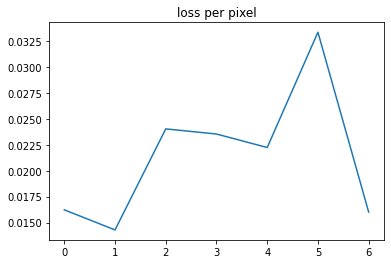

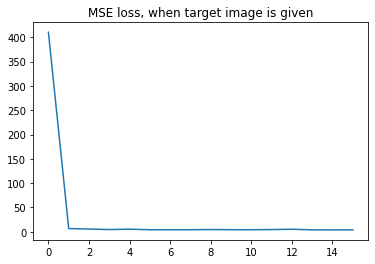

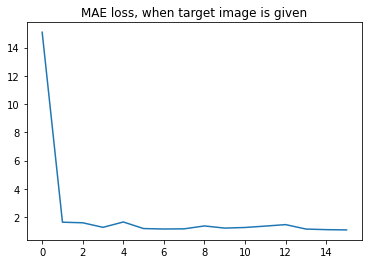

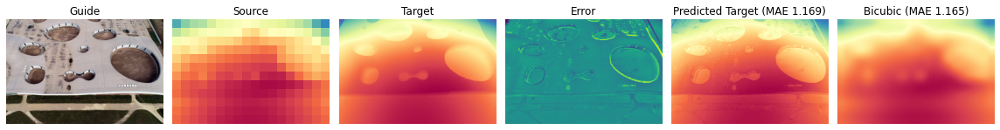

MSE: 4.150  ---  MAE: 1.169  ---  PBP: 0.337



####### image 11/25 - image idx 10 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[370.26114     5.6260295   5.2414904   4.933583    5.1966763   4.3236194
   3.943675    3.5219474   3.9313445   3.6133602   3.4070718   3.6720834
   3.4138172   3.6049254   3.5803235   3.4476972]
----------MAE----------
(16,)
[14.255274   1.4596267  1.4796262  1.3594245  1.426      1.2990705
  1.1908957  1.1205405  1.2808675  1.1288948  1.148916   1.221916
  1.1518676  1.1778485  1.2031885  1.1327381]


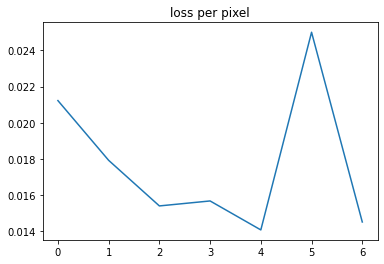

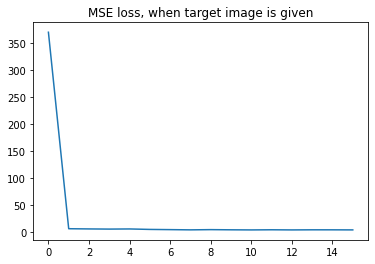

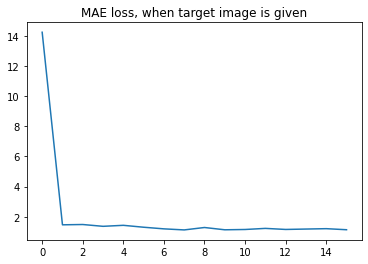

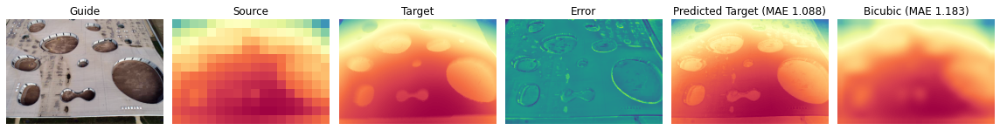

MSE: 3.150  ---  MAE: 1.088  ---  PBP: 0.331



####### image 12/25 - image idx 11 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[442.51584     7.4973946   5.3900266   5.701959    4.269966    3.9523373
   3.710931    3.542382    3.4280448   3.6451433   3.5566232   3.4414778
   3.2803085   3.282734    3.2666974   3.7030294]
----------MAE----------
(16,)
[16.014132   1.7515439  1.4464098  1.4856573  1.2614992  1.250949
  1.1682478  1.1136918  1.0743481  1.1602787  1.0708447  1.1371635
  1.0534176  1.0890632  1.076396   1.2161833]


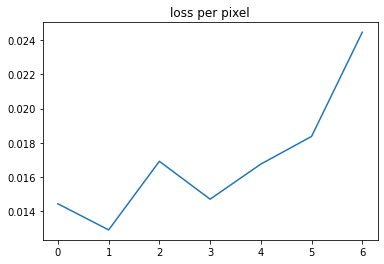

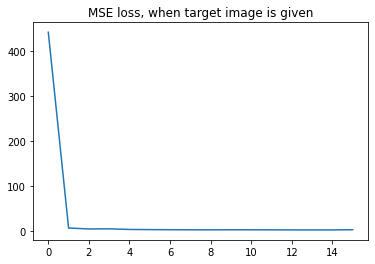

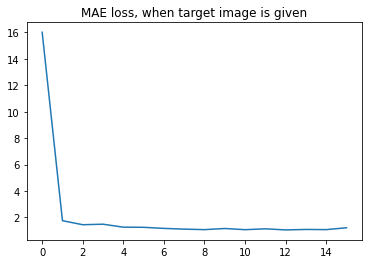

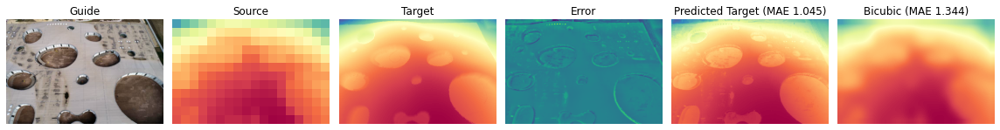

MSE: 3.168  ---  MAE: 1.045  ---  PBP: 0.292



####### image 13/25 - image idx 12 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[403.45667    14.387184    8.429504    9.140798    7.209281    7.0512767
   6.8989973   6.8976684   6.216195    6.4099474   6.5897527   5.6925135
   5.8185086   6.090184    6.4707003   5.9205728]
----------MAE----------
(16,)
[15.070266   2.721944   1.7837726  1.8247291  1.5423175  1.6113216
  1.7371724  1.6431255  1.4765264  1.5044743  1.5370775  1.3577958
  1.3694608  1.4072251  1.5580873  1.4378712]


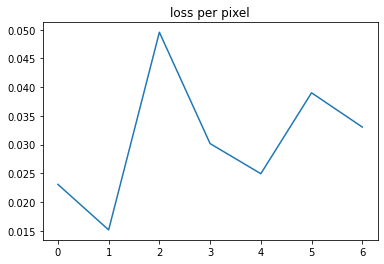

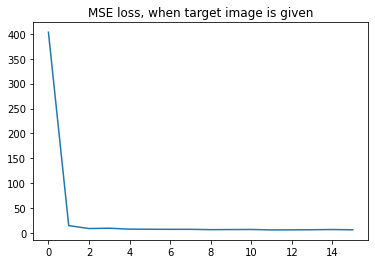

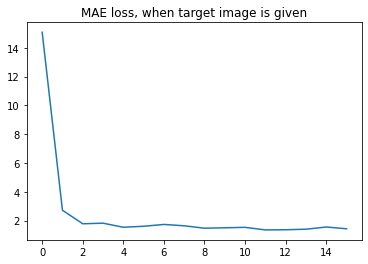

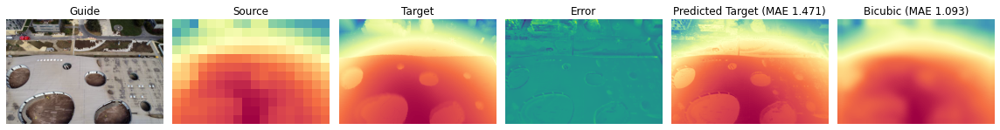

MSE: 6.189  ---  MAE: 1.471  ---  PBP: 0.406



####### image 14/25 - image idx 13 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[343.89468   14.365859  11.482777  12.37262   11.068007  10.040547
  12.995994  10.960448   9.430988  10.534307   9.820284   9.0117
   9.036141  10.026871   9.182685   9.094917]
----------MAE----------
(16,)
[13.484236   2.348221   1.819521   2.3433752  1.817981   1.8061234
  2.4254906  1.65596    1.5838668  1.8441992  1.7467989  1.5332842
  1.5654185  1.7846723  1.5617198  1.5712059]


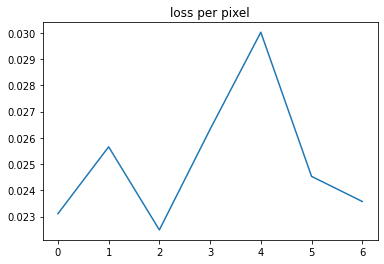

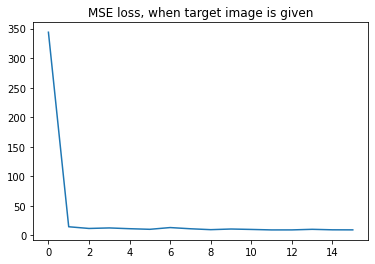

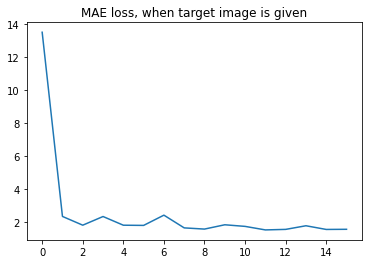

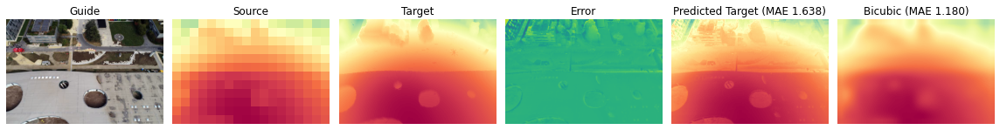

MSE: 9.927  ---  MAE: 1.638  ---  PBP: 0.363



####### image 15/25 - image idx 14 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[431.31573   17.899975  17.446115  17.308723  15.896337  15.909697
  16.574024  15.10506   14.964572  15.493424  15.205213  16.538815
  16.01512   16.437994  15.779739  15.782111]
----------MAE----------
(16,)
[15.599255   2.5996435  2.4951882  2.493649   2.336773   2.2964065
  2.5132725  2.1876736  2.1850994  2.1732993  2.1007893  2.2609537
  2.1419203  2.2395923  2.094262   2.1252925]


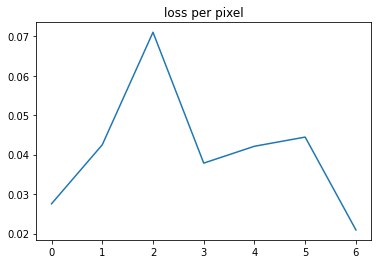

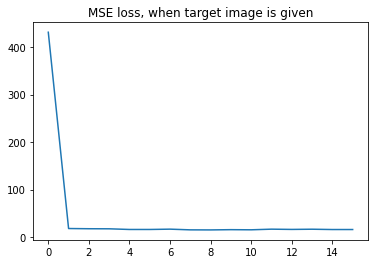

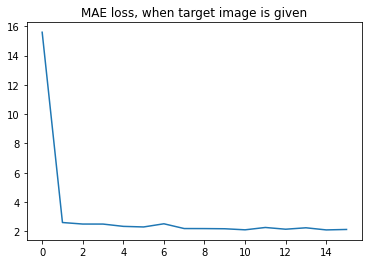

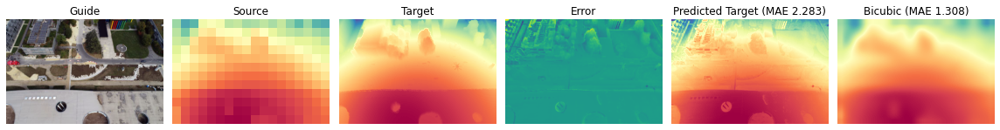

MSE: 16.546  ---  MAE: 2.283  ---  PBP: 0.539



####### image 16/25 - image idx 15 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[314.34555   28.783152  31.674868  24.619404  27.424849  26.652819
  27.304913  29.026735  28.828415  28.169601  27.52304   26.894762
  27.370132  28.500996  26.309986  29.164785]
----------MAE----------
(16,)
[13.910064   3.448848   3.3990083  2.8527834  2.8590803  2.9810562
  2.8571997  2.88833    2.9438622  2.8508394  2.7938342  2.7292914
  2.783313   2.7972238  2.7096417  2.8451166]


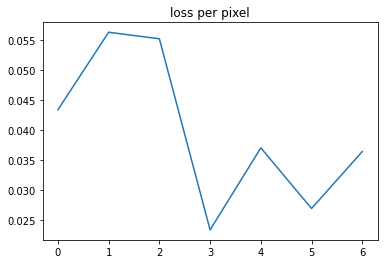

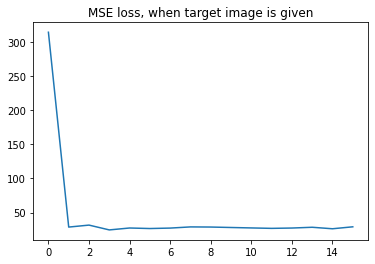

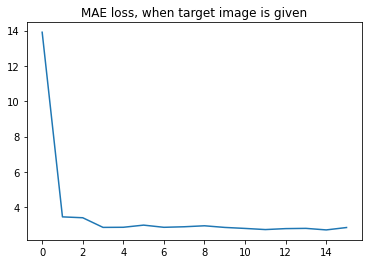

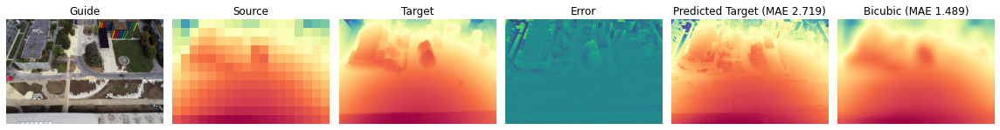

MSE: 26.164  ---  MAE: 2.719  ---  PBP: 0.522



####### image 17/25 - image idx 16 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[235.59007   28.070358  28.846743  26.868292  32.24876   26.36636
  26.732742  25.739182  26.059938  27.646584  25.746082  24.989687
  26.32577   25.36904   24.316418  24.366806]
----------MAE----------
(16,)
[11.712862   3.489387   3.6630743  3.2913506  3.7624493  3.0812435
  2.9965277  2.960493   2.9594157  3.043019   2.9301214  2.8455858
  2.8861103  2.7890885  2.7353466  2.724321 ]


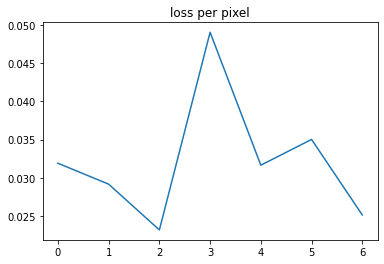

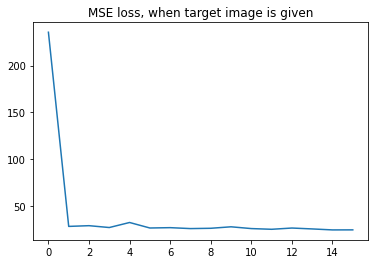

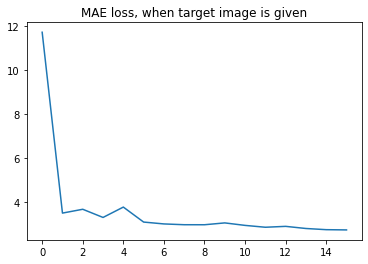

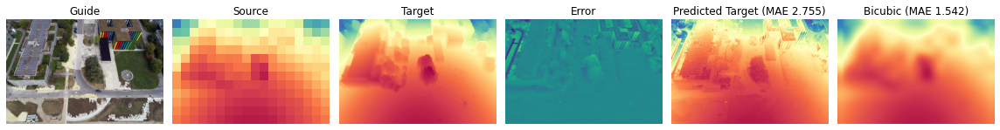

MSE: 25.219  ---  MAE: 2.755  ---  PBP: 0.509



####### image 18/25 - image idx 17 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[255.71269   33.306335  34.651672  26.838814  23.684116  23.608215
  22.042782  21.518225  20.14366   18.97001   17.390575  18.192415
  17.217045  17.231365  18.332087  16.649225]
----------MAE----------
(16,)
[11.648838   4.010722   4.076785   3.39536    3.2479587  3.2150123
  3.0756648  3.04664    3.0038788  2.8358195  2.7423947  2.7067037
  2.586695   2.5933707  2.7722127  2.5722697]


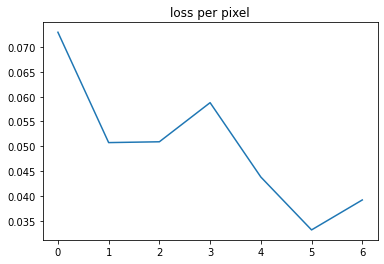

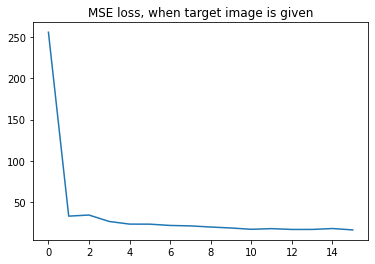

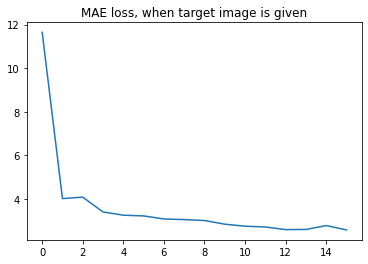

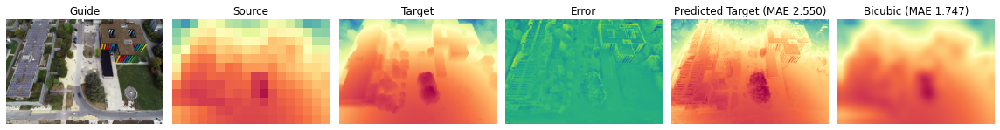

MSE: 16.258  ---  MAE: 2.550  ---  PBP: 0.628



####### image 19/25 - image idx 18 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[331.64825   40.43062   38.17992   35.558895  32.046806  34.833473
  33.379154  29.971111  28.428026  25.59904   26.48239   25.437176
  24.709     24.784702  24.005518  22.119291]
----------MAE----------
(16,)
[13.369981   4.423635   4.0917916  4.011221   3.6209805  4.127651
  3.6300163  3.4630737  3.2948647  3.2271209  3.3415074  3.1242678
  3.0673547  3.069969   3.0690727  2.9374619]


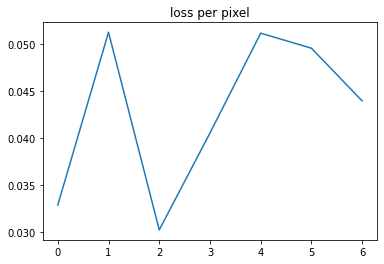

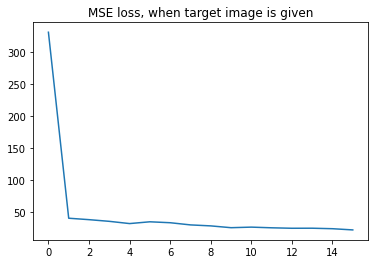

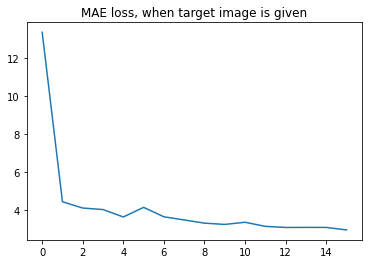

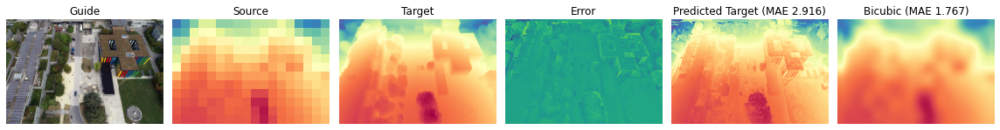

MSE: 20.798  ---  MAE: 2.916  ---  PBP: 0.680



####### image 20/25 - image idx 19 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[216.42343    24.87068    22.704832   20.679409   20.005362   16.806276
  16.063618   17.935526   14.582308   14.658488   14.0792465  14.237728
  13.88914    14.577404   13.428576   13.7054   ]
----------MAE----------
(16,)
[10.760412   3.5205455  3.3028185  3.1081524  3.1190183  2.7488816
  2.7213     2.9728003  2.5847054  2.6495795  2.5380595  2.551736
  2.5520356  2.5963173  2.4882748  2.468704 ]


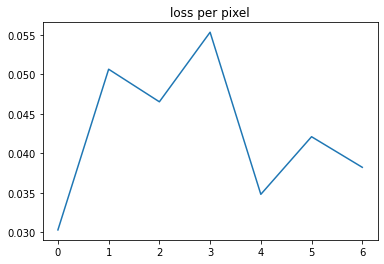

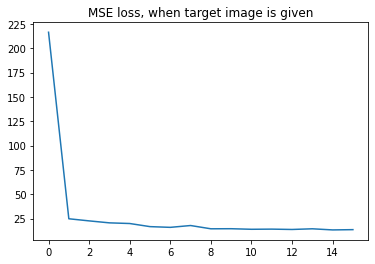

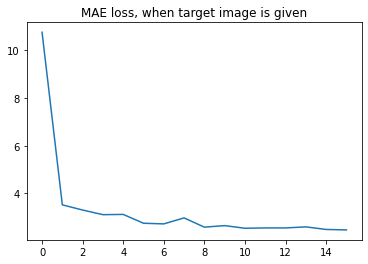

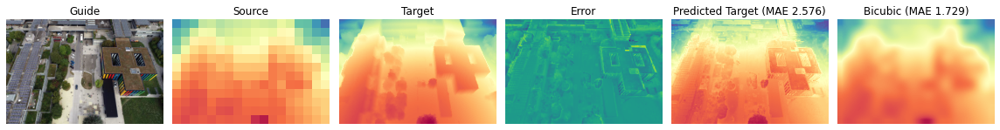

MSE: 14.726  ---  MAE: 2.576  ---  PBP: 0.648



####### image 21/25 - image idx 20 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[413.34573   51.332157  50.840183  37.640606  36.413147  36.83364
  33.605545  32.498444  32.53467   31.217806  31.822401  29.44875
  28.519884  27.408691  27.449123  29.411835]
----------MAE----------
(16,)
[14.926976   5.191795   5.1477494  4.3315754  4.2165866  4.175448
  3.9708536  3.9436624  3.913233   3.8312297  3.8705957  3.733665
  3.6236184  3.575596   3.5684586  3.6575773]


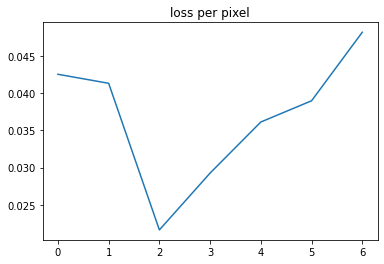

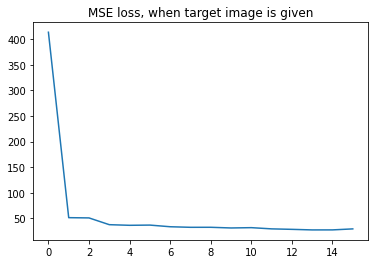

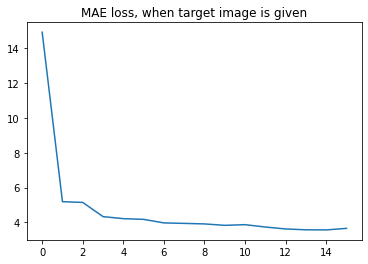

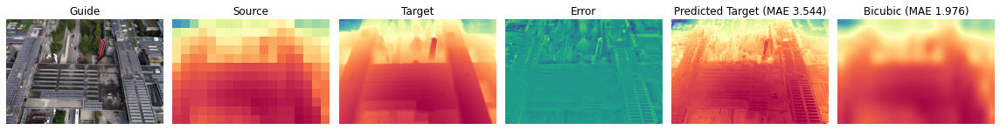

MSE: 27.649  ---  MAE: 3.544  ---  PBP: 0.716



####### image 22/25 - image idx 21 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[337.15466   43.579136  37.78988   36.621017  27.144941  25.657135
  26.113047  26.943432  25.562893  23.273872  22.111378  22.83648
  24.85941   22.691536  23.132912  22.37919 ]
----------MAE----------
(16,)
[14.445556   4.6846724  4.202768   4.0772824  3.546228   3.4913495
  3.4830592  3.5354226  3.430993   3.2161343  3.14683    3.2485619
  3.4212687  3.1640697  3.1897042  3.1610434]


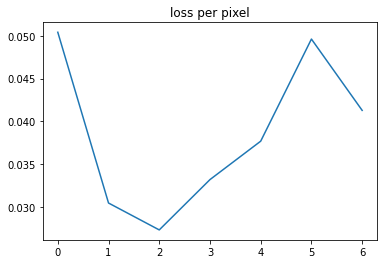

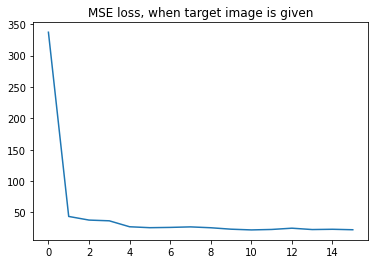

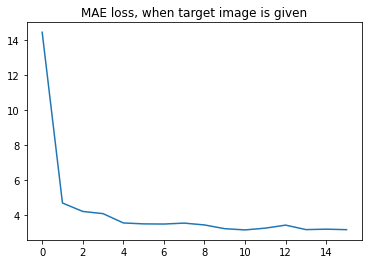

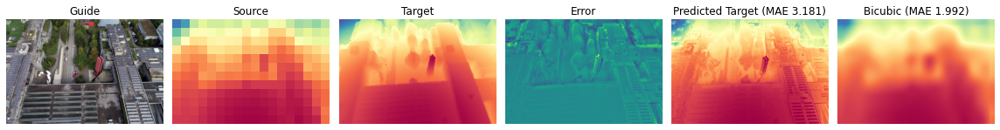

MSE: 22.811  ---  MAE: 3.181  ---  PBP: 0.668



####### image 23/25 - image idx 22 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[375.64603   47.638287  40.381145  37.923702  37.45313   33.520878
  32.91739   32.967197  31.116898  32.152718  30.24825   29.914297
  29.781294  33.470345  29.586676  30.638622]
----------MAE----------
(16,)
[15.343963   5.037363   4.5074344  4.3276825  4.3112254  4.009465
  3.8587089  3.8825383  3.7155302  3.7940636  3.6455505  3.6291845
  3.5999117  3.8603873  3.5719132  3.617685 ]


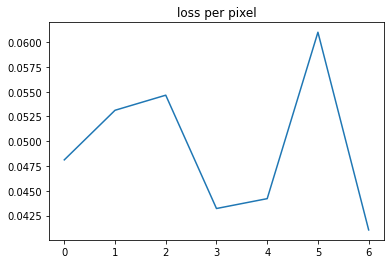

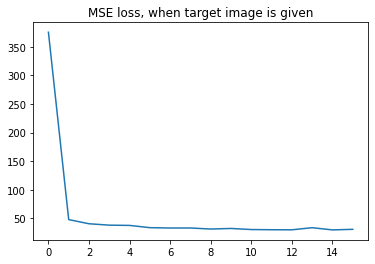

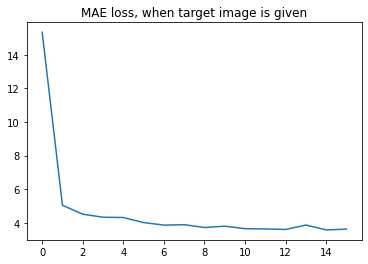

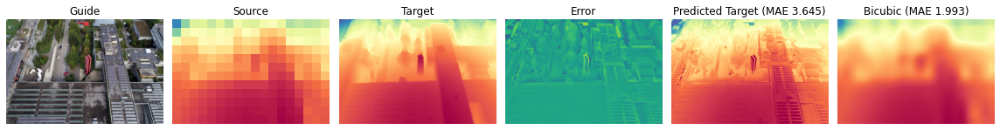

MSE: 29.157  ---  MAE: 3.645  ---  PBP: 0.758



####### image 24/25 - image idx 23 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[453.34427   44.121372  42.714657  37.77822   36.00862   36.137424
  30.857779  30.750637  32.2622    31.77425   32.45308   30.201574
  29.361506  26.999542  28.481308  32.197037]
----------MAE----------
(16,)
[15.6829195  4.8520637  4.8461633  4.5790257  4.527736   4.4435034
  4.029366   3.9381094  4.0377445  4.093298   4.049095   3.9348423
  3.8337638  3.654725   3.772458   3.9927032]


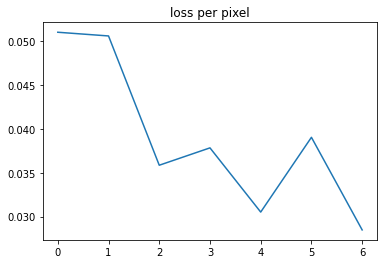

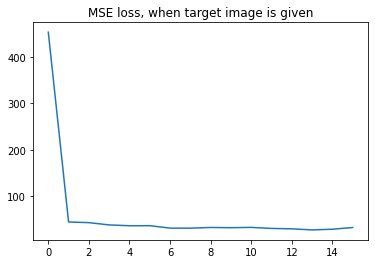

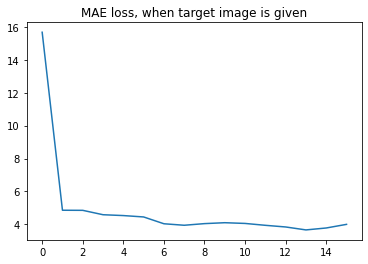

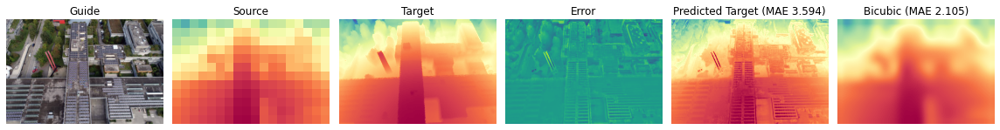

MSE: 26.928  ---  MAE: 3.594  ---  PBP: 0.730



####### image 25/25 - image idx 24 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[266.89594   39.17133   40.54755   38.511505  37.548416  37.57748
  34.52778   32.19841   30.25417   29.329128  30.484953  29.273672
  29.55408   26.61051   28.30555   28.449293]
----------MAE----------
(16,)
[12.787902   4.6541514  4.74625    4.617329   4.4880743  4.5011826
  4.254555   4.0418153  3.8800788  3.7579942  3.8200245  3.75864
  3.6918168  3.4745927  3.544067   3.5719297]


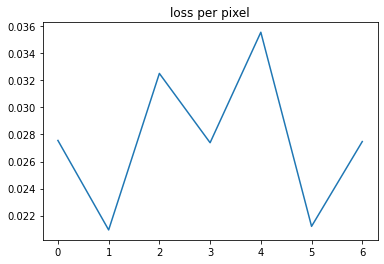

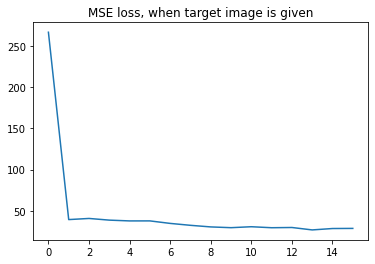

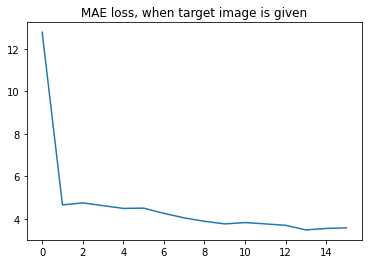

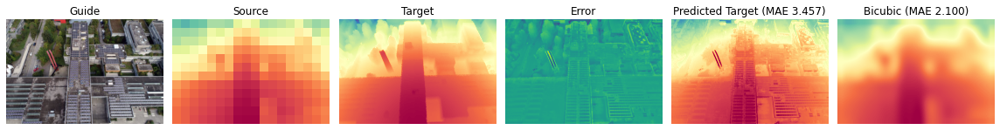

MSE: 26.483  ---  MAE: 3.457  ---  PBP: 0.725





In [8]:
####  define parameters  ########################################################
params = {'img_idxs' : [], # idx images to process, if empty then all of them
            
          'scaling': 40,
          'greyscale': False, # Turn image into grey-scale
          'channels': -1,
          
          'spatial_features_input': True,
          'weights_regularizer': [0.0001, 0.001, 0.0001], # spatial color head
          'loss': 'l1',
 
          'optim': 'adam',
          'lr': 0.001,
                  
          'batch_size': 32,
          'iteration': 1024*12*18//32,
                  
          'logstep': 64,
          
          'final_TGV' : False, # Total Generalized Variation in post-processing
          'align': False, # Move image around for evaluation in case guide image and target image are not perfectly aligned
          'delta_PBP': 1, # Delta for percentage of bad pixels 
         }

#### train and plot the results ################################################
if len(params['img_idxs'])==0:
    idxs = np.array(range(0,target_imgs.shape[0]))
else:
    idxs = params['img_idxs']

constant = 0
    
for n_image,idx in enumerate(idxs):
    
    print("####### image {}/{} - image idx {} ########".format(n_image+1,len(idxs),idx))
    
    guide_img = guide_imgs[idx]
    target_img = target_imgs[idx]
    source_img = downsample(target_img,params['scaling'])
    save_path = directory+'/saved_model_EPFL_oblique/model'+str(constant + idx)+'.pt'
    # check if the directory exist
    os.makedirs(os.path.dirname(save_path),exist_ok=True)
    
    bicubic_target_img = bicubic(source_img=source_img, scaling_factor=params['scaling'])
    
    predicted_target_img = PixTransform(guide_img=guide_img,source_img=source_img,params=params,target_img=target_img, path = save_path)
    


    if params['final_TGV'] :
        print("applying TGV...")
        predicted_target_img = tvgen(predicted_target_img,[0.1, 0.1],[1, 2],[1, 1])
        
    if params['align'] :
        print("aligning...")
        target_img,predicted_target_img = align_images(target_img,predicted_target_img)

    f, ax = plot_result(guide_img,source_img,predicted_target_img,bicubic_target_img,target_img)
    plt.show()
    
    if target_img is not None:
        # compute metrics and plot results
        MSE = np.mean((predicted_target_img - target_img) ** 2)
        MAE = np.mean(np.abs(predicted_target_img - target_img))
        PBP = np.mean(np.abs(predicted_target_img - target_img) > params["delta_PBP"])

        print("MSE: {:.3f}  ---  MAE: {:.3f}  ---  PBP: {:.3f}".format(MSE,MAE,PBP))
        print("\n\n")
 


### Change upsampling to 90， here first try crop the image to 450x720

In [9]:

torch.cuda.empty_cache()

In [10]:
guide_imgs = []
target_imgs= []

for num in range(len(_rgb_files)):
    rgb_img = imageio.imread(_rgb_files[num])
    guide_imgs.append(rgb_img)
    dist_img = torch.load(_dist_files[num])
    dist_img = dist_img.detach().cpu().numpy()
    target_imgs.append(dist_img)
        
guide_imgs = np.asarray(guide_imgs)
guide_imgs = np.einsum('ijkl->iljk', guide_imgs)        
target_imgs = np.asarray(target_imgs)

In [11]:
## crop images
new_guide_imgs = guide_imgs[:,:,15:465,:]
new_target_imgs = target_imgs[:,15:465,:]
print(new_guide_imgs.shape)
print(new_target_imgs.shape)

(25, 3, 450, 720)
(25, 450, 720)


####### image 1/25 - image idx 0 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[404.80676   34.132366  23.759764  24.120703  18.273727  18.144169
  15.911155  15.744917  14.883516  14.762838  13.313753  15.130324
  11.843289  14.325118  13.971438  13.980543]
----------MAE----------
(16,)
[16.517838   3.790193   3.0371528  3.5336235  2.7212646  2.6146805
  2.4815388  2.4139256  2.3430686  2.3675394  2.2217023  2.3895745
  2.0936792  2.435306   2.2775083  2.3785048]


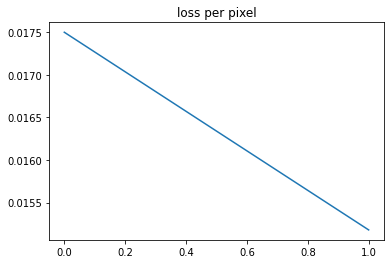

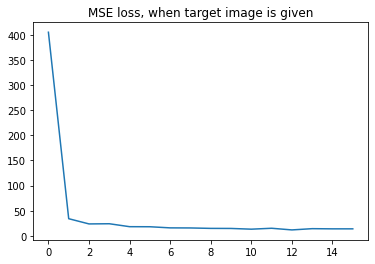

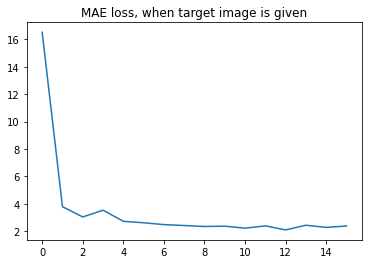

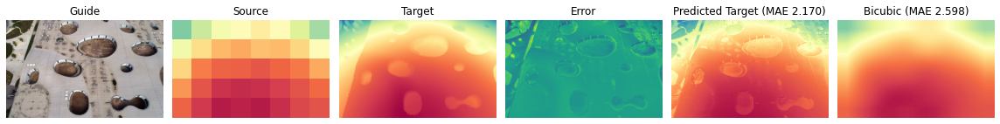

MSE: 12.662  ---  MAE: 2.170  ---  PBP: 0.519



####### image 2/25 - image idx 1 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[570.1373    44.03895   32.882637  29.741982  25.532942  24.70721
  24.244022  25.590418  25.252922  23.035887  18.91808   20.409115
  17.562119  20.736029  20.330837  19.50544 ]
----------MAE----------
(16,)
[17.447166   5.0657573  4.026845   3.6772432  3.4004562  3.5249662
  3.3345432  3.1292658  3.1543744  3.0433242  2.7679985  2.8118029
  2.6606393  2.9894238  2.7927897  2.8017623]


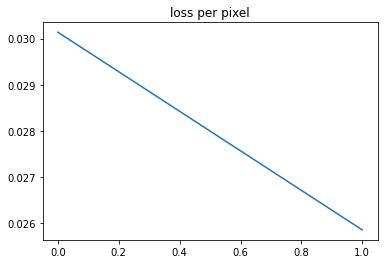

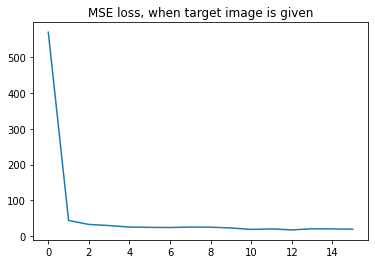

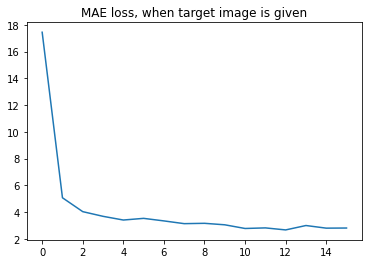

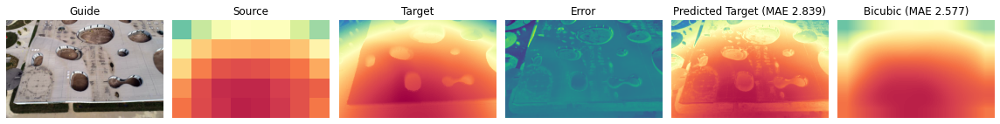

MSE: 19.525  ---  MAE: 2.839  ---  PBP: 0.675



####### image 3/25 - image idx 2 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[453.67517   56.564297  39.648636  32.975662  25.257732  27.069878
  23.196173  21.687063  23.83174   20.452518  19.233969  17.883097
  16.819553  17.274605  18.784967  17.524734]
----------MAE----------
(16,)
[14.895312   5.7623963  4.7017856  4.4331093  3.6019711  3.7391517
  3.3339794  3.230091   3.4855208  3.0674288  3.041139   2.9124591
  2.738198   2.7577088  2.8822083  2.7678246]


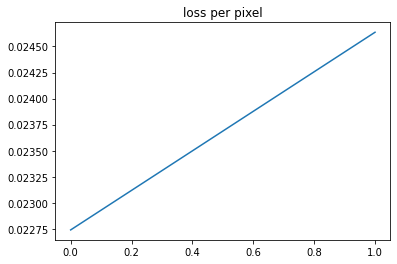

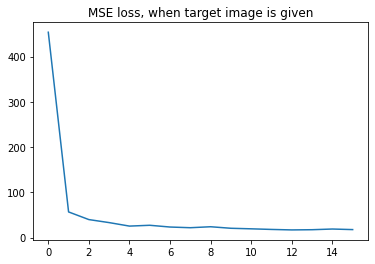

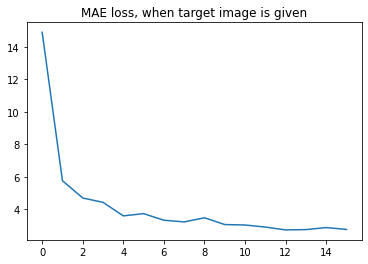

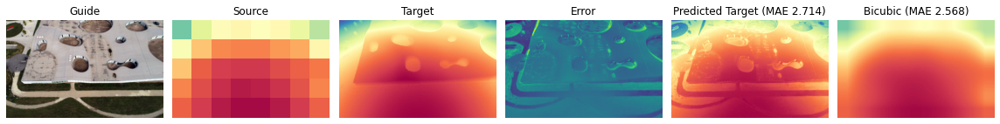

MSE: 16.914  ---  MAE: 2.714  ---  PBP: 0.644



####### image 4/25 - image idx 3 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[349.49158   36.779247  23.504383  22.478334  18.739506  18.620417
  19.105413  18.447365  19.574284  21.944258  19.209862  19.751581
  19.102306  19.682915  22.279892  20.29321 ]
----------MAE----------
(16,)
[14.252772   4.44556    3.5125685  3.3464346  2.9876695  3.0224473
  2.9999013  2.982343   3.0250387  3.1050694  2.977112   3.1719759
  2.9910445  3.0495508  3.0888727  3.0630898]


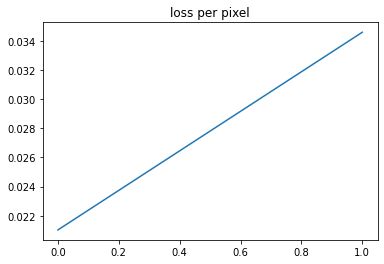

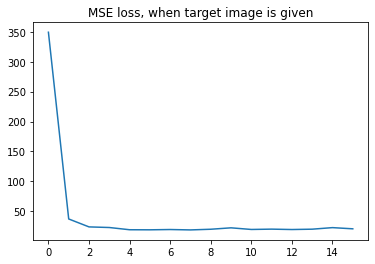

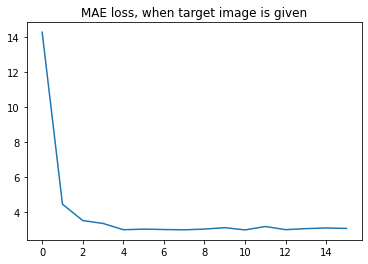

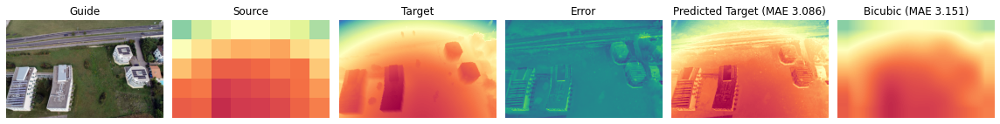

MSE: 20.564  ---  MAE: 3.086  ---  PBP: 0.670



####### image 5/25 - image idx 4 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[284.67044   55.446114  54.64409   48.343815  41.578304  40.83245
  33.723515  33.037907  32.290363  34.515015  29.542057  30.586498
  30.881775  30.953749  28.196352  29.494705]
----------MAE----------
(16,)
[13.273647   5.454197   5.132951   4.94274    4.4536448  4.23889
  3.8637774  3.8236418  3.7685533  4.0177217  3.550264   3.6663117
  3.677544   3.7363365  3.5678527  3.5205734]


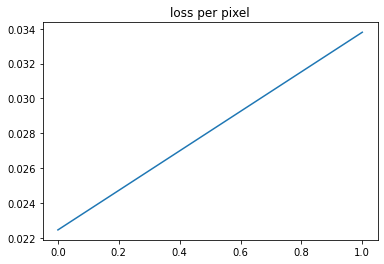

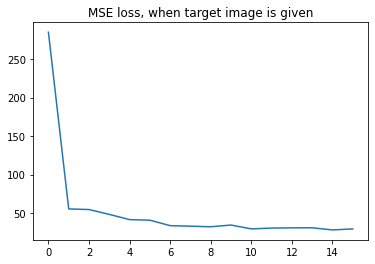

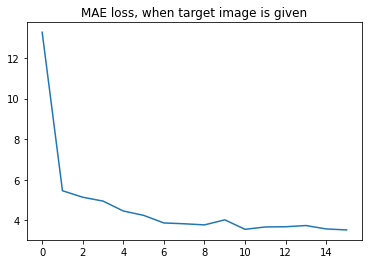

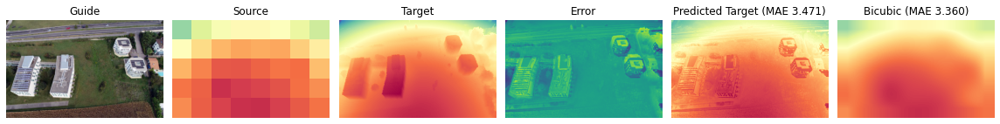

MSE: 28.391  ---  MAE: 3.471  ---  PBP: 0.681



####### image 6/25 - image idx 5 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[359.1408    64.582344  55.748123  46.794586  41.25358   38.891113
  35.223534  32.4556    32.980736  29.660782  30.428167  30.6526
  30.081446  27.164526  27.806347  28.664074]
----------MAE----------
(16,)
[13.757836   5.8784385  5.421083   4.956269   4.5795226  4.287504
  3.9994893  4.0376434  3.8624318  3.7474306  3.773558   3.6717694
  3.7731345  3.512565   3.6424527  3.6306899]


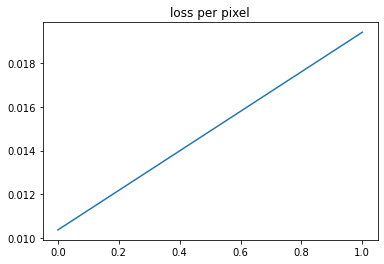

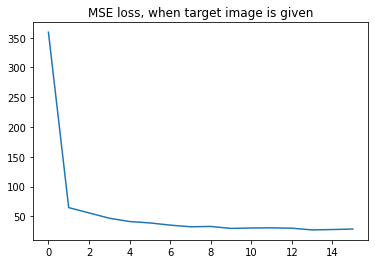

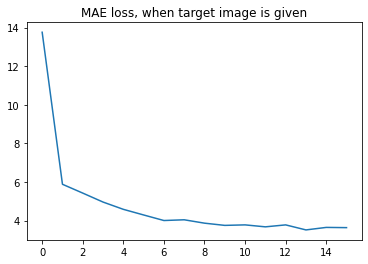

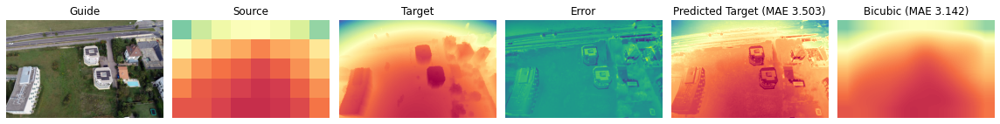

MSE: 27.276  ---  MAE: 3.503  ---  PBP: 0.709



####### image 7/25 - image idx 6 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[346.4704    31.643261  20.161455  17.287262  17.721073  15.262521
  18.305456  13.940363  15.597611  14.696988  13.503427  15.259703
  20.626295  16.603287  17.03352   15.479417]
----------MAE----------
(16,)
[14.518485   4.251503   3.2338345  2.9656186  3.046061   2.7782106
  3.1254797  2.6300175  2.8832607  2.6940587  2.5758605  2.7975333
  3.3221211  2.967803   2.943727   2.7952027]


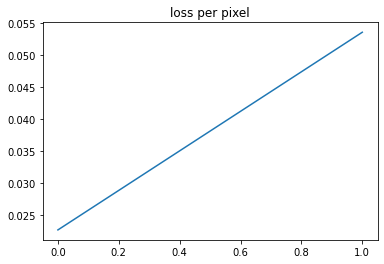

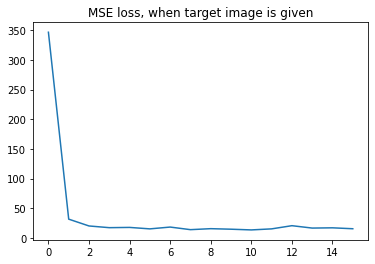

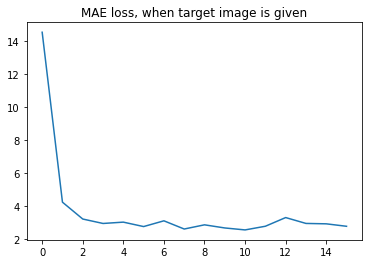

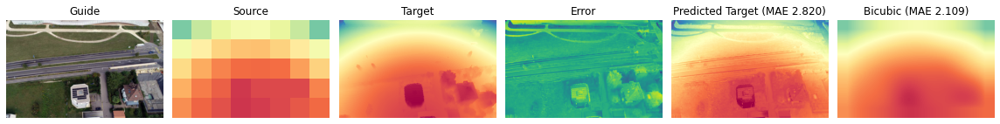

MSE: 15.494  ---  MAE: 2.820  ---  PBP: 0.700



####### image 8/25 - image idx 7 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[273.03644    18.477697   12.6785755  11.67861    11.55382    11.007842
  11.7912245  11.602577   10.322356   10.854772   10.753229   10.462966
  10.067809    9.904972    9.513603    9.343423 ]
----------MAE----------
(16,)
[12.686384   3.1553638  2.4147403  2.3189707  2.2624907  2.2122388
  2.361416   2.278534   2.1450222  2.3337488  2.0435767  2.0143414
  2.1248026  2.0215995  1.91531    1.8963457]


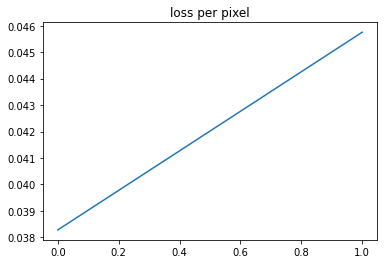

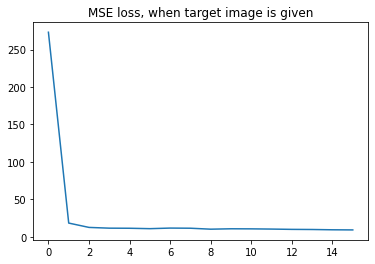

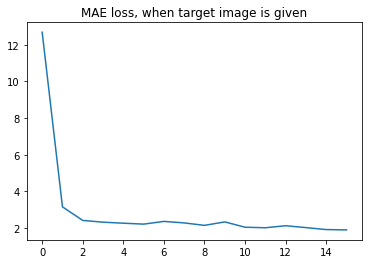

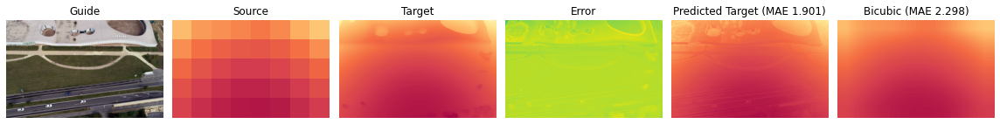

MSE: 9.707  ---  MAE: 1.901  ---  PBP: 0.498



####### image 9/25 - image idx 8 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[326.25467   46.830704  31.206877  30.903439  22.132902  19.847414
  19.45187   21.142155  16.801395  15.568154  17.521984  14.710356
  13.97375   13.45955   13.711843  12.841033]
----------MAE----------
(16,)
[12.98882    4.6843705  3.7764337  3.9253466  3.2068977  3.1819935
  3.1402278  3.2579534  2.8034232  2.7482297  2.8870945  2.7846227
  2.6670244  2.5093696  2.551656   2.407034 ]


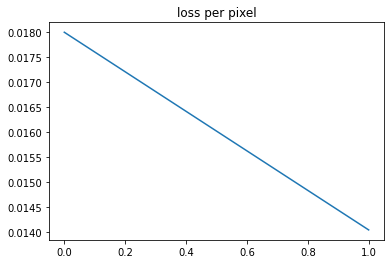

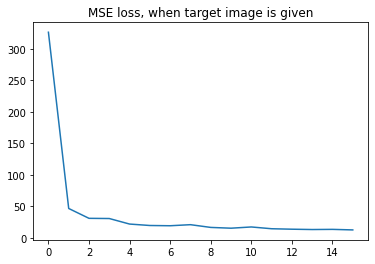

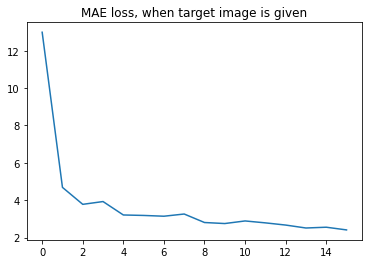

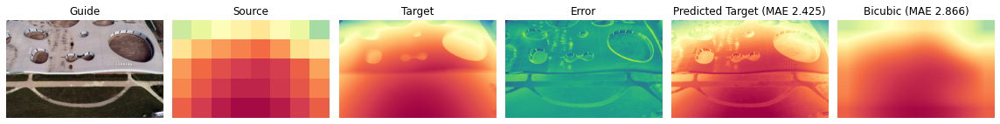

MSE: 12.445  ---  MAE: 2.425  ---  PBP: 0.645



####### image 10/25 - image idx 9 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[375.24786    35.868988   22.81402    14.352125   18.126034   16.678955
  17.23225    14.8948765  13.11447    14.491904   12.824847   16.38381
  13.253425   14.349831   14.614243   14.4621315]
----------MAE----------
(16,)
[14.805318   4.495188   3.6312315  2.7531078  2.9919734  2.8922262
  2.9806914  2.6551287  2.5351167  2.6125445  2.5131135  2.8897617
  2.5658252  2.6522398  2.6781816  2.7174416]


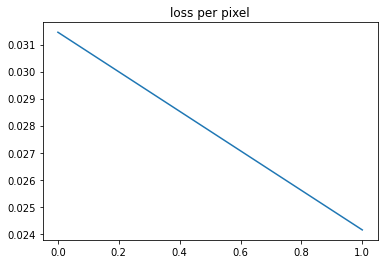

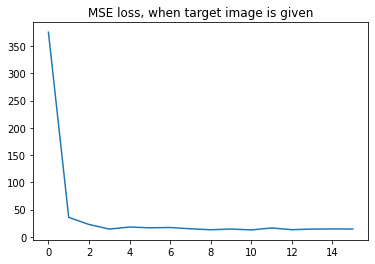

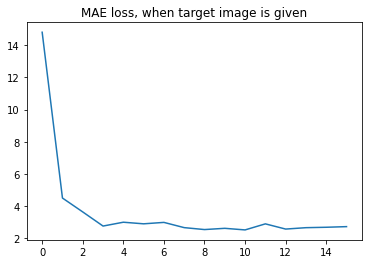

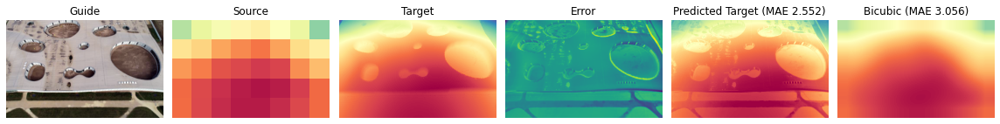

MSE: 13.199  ---  MAE: 2.552  ---  PBP: 0.679



####### image 11/25 - image idx 10 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[380.6107    31.205956  24.439428  24.762693  21.582315  19.89549
  19.664799  19.280943  20.330442  17.109575  18.080185  16.596344
  17.554512  15.016266  15.816297  14.698121]
----------MAE----------
(16,)
[15.976309   3.9913783  3.5004723  3.6477551  3.4033613  3.246734
  2.9641879  3.0106597  3.1255405  2.884906   3.200705   2.7363071
  2.7415426  2.6545827  2.729139   2.750606 ]


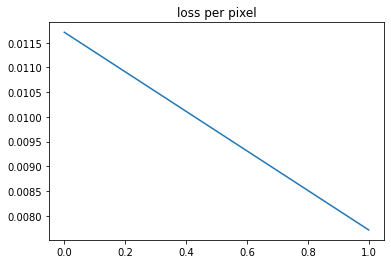

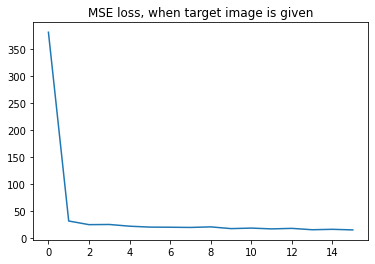

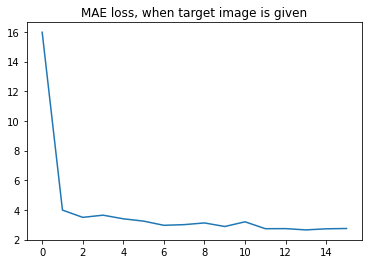

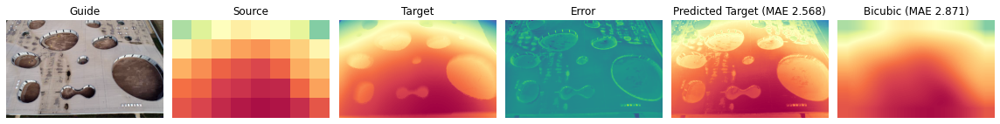

MSE: 15.074  ---  MAE: 2.568  ---  PBP: 0.648



####### image 12/25 - image idx 11 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[383.25003   86.545715  45.76363   35.88709   30.088018  27.243528
  21.411837  22.216503  20.887932  22.510704  21.602829  19.648087
  18.459934  20.903702  17.11732   18.888205]
----------MAE----------
(16,)
[15.302749   6.391538   4.7318864  4.038185   3.6264334  3.4632852
  3.0151012  3.0350575  2.8964317  3.089382   3.1496801  2.9504037
  2.9152021  2.9829237  2.7397027  2.9170058]


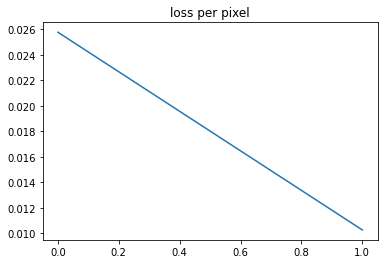

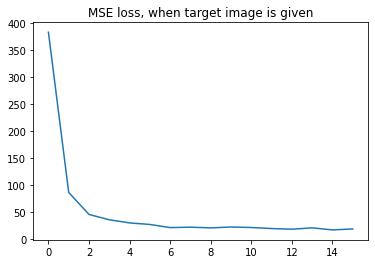

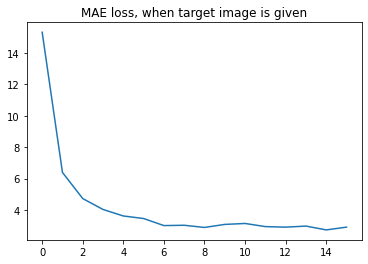

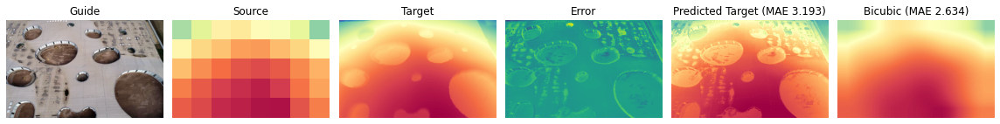

MSE: 19.173  ---  MAE: 3.193  ---  PBP: 0.808



####### image 13/25 - image idx 12 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[367.6756    41.951187  31.1369    30.632532  24.353474  23.50139
  22.453735  19.21934   19.674646  18.081223  19.020039  18.408707
  18.86698   15.501837  16.30421   15.438575]
----------MAE----------
(16,)
[15.605655   4.76525    4.1109753  4.178192   3.370288   3.3013504
  3.2366047  3.1558447  3.0446606  2.8728015  3.2281535  2.957774
  2.9989557  2.6834571  2.8115861  2.603464 ]


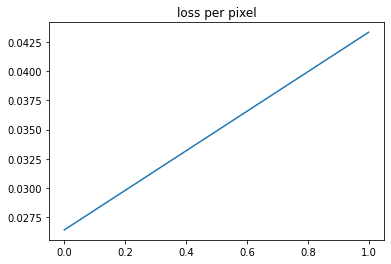

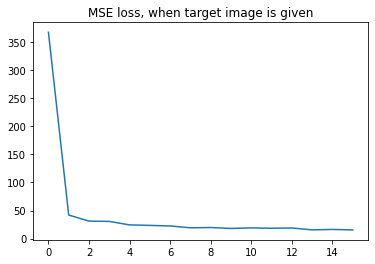

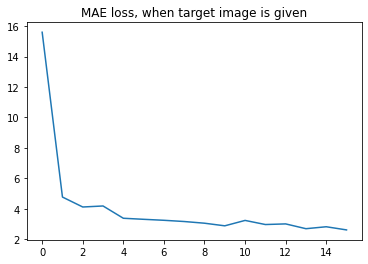

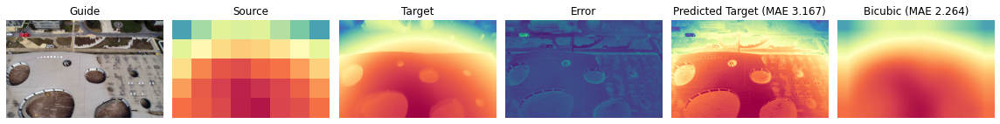

MSE: 19.065  ---  MAE: 3.167  ---  PBP: 0.806



####### image 14/25 - image idx 13 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[322.8592    38.947536  21.278036  21.783625  21.480373  21.832954
  20.975674  24.052437  25.009861  21.528313  24.24797   24.476948
  26.328829  25.98911   26.607977  23.996895]
----------MAE----------
(16,)
[14.985398   4.634616   3.1878464  3.084777   3.0430293  2.9619176
  2.8228905  2.9491062  3.0507014  3.1109068  3.2340934  3.1014686
  3.1609724  3.1990938  3.312398   3.1806448]


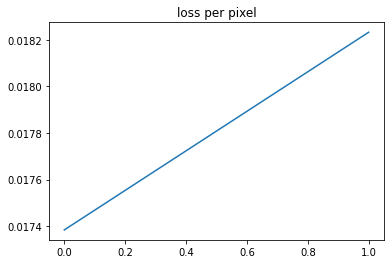

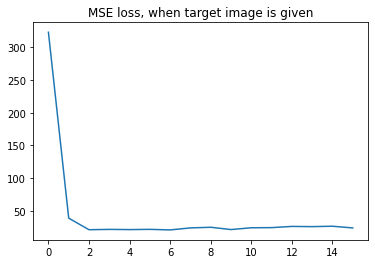

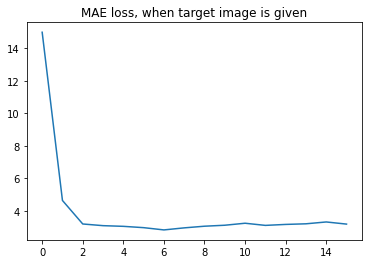

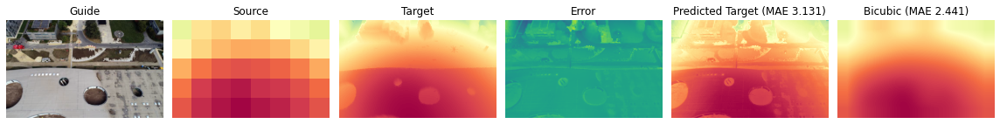

MSE: 25.290  ---  MAE: 3.131  ---  PBP: 0.635



####### image 15/25 - image idx 14 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[337.27386   41.354267  42.021305  32.800877  31.503433  28.1066
  28.279041  26.312605  28.20377   24.834194  25.602938  24.677197
  22.629025  22.559324  25.017963  21.427965]
----------MAE----------
(16,)
[15.544256   4.7203517  4.660878   3.9906745  3.928566   3.6679816
  3.6999438  3.5631328  3.8388588  3.4444284  3.507069   3.4826143
  3.2195685  3.2409842  3.5441074  3.1025796]


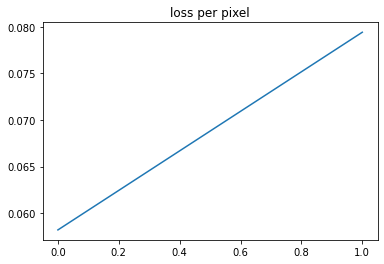

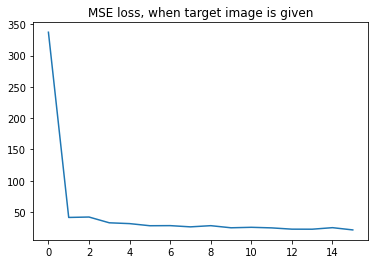

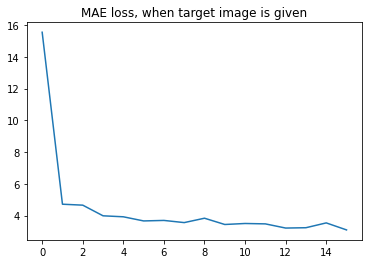

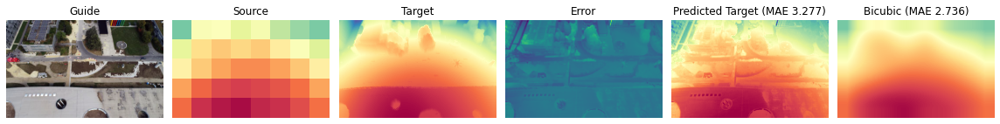

MSE: 22.512  ---  MAE: 3.277  ---  PBP: 0.735



####### image 16/25 - image idx 15 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[326.2965    41.396835  41.300137  52.515778  54.628235  54.61126
  55.890823  53.395657  54.659145  52.46372   50.218895  49.74303
  49.060673  48.5835    48.639233  49.204346]
----------MAE----------
(16,)
[13.85028    4.401721   4.551169   5.3869452  5.4134383  5.4452887
  5.360551   5.2002287  5.226953   5.097512   5.0648413  4.9897985
  4.960859   4.9450827  4.7921686  4.8638773]


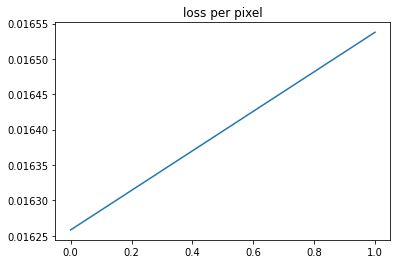

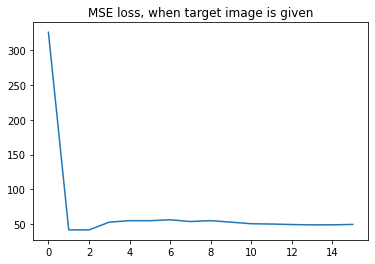

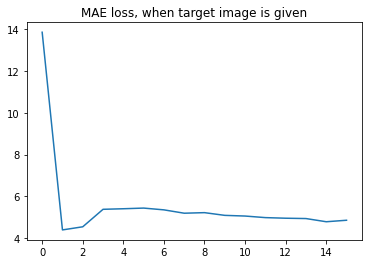

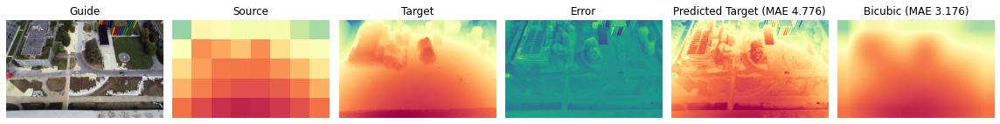

MSE: 47.901  ---  MAE: 4.776  ---  PBP: 0.815



####### image 17/25 - image idx 16 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[330.7964    55.3647    42.96642   50.174397  42.417953  48.190582
  49.91188   46.024044  48.901005  52.81936   50.60588   47.987404
  50.89102   51.915817  53.29486   54.87065 ]
----------MAE----------
(16,)
[13.979752   5.683742   4.806596   5.2855372  4.944611   4.993264
  5.166838   4.8735995  5.0369363  5.4287167  5.170639   4.9184422
  5.0600066  5.1371794  5.2561374  5.3676805]


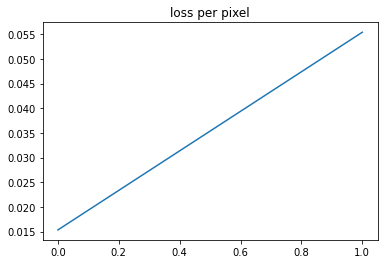

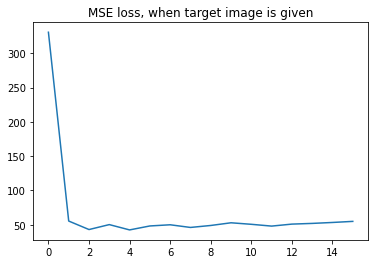

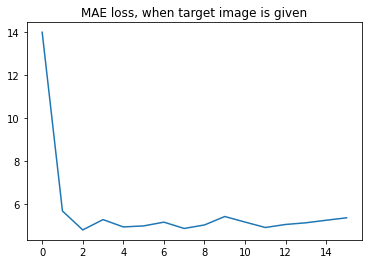

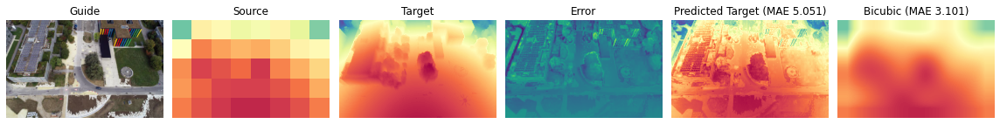

MSE: 50.644  ---  MAE: 5.051  ---  PBP: 0.832



####### image 18/25 - image idx 17 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[376.20862   55.306347  52.489044  54.05652   47.90742   53.22051
  52.893333  48.143444  51.735924  49.15994   51.861546  51.071495
  48.009262  49.962563  50.844322  48.896297]
----------MAE----------
(16,)
[13.874615   5.078346   5.179693   5.2711205  4.814664   5.2473006
  5.0986075  4.921108   5.114562   4.984336   5.0786796  5.183191
  4.885813   5.0301437  5.0726643  4.989583 ]


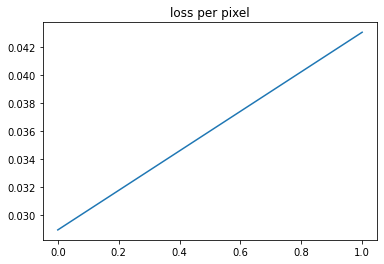

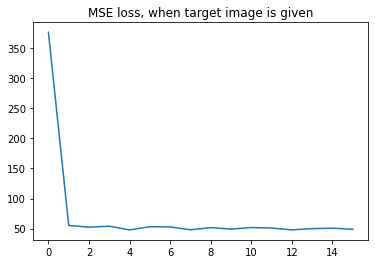

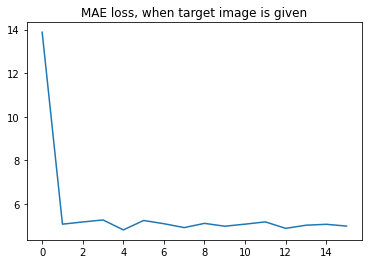

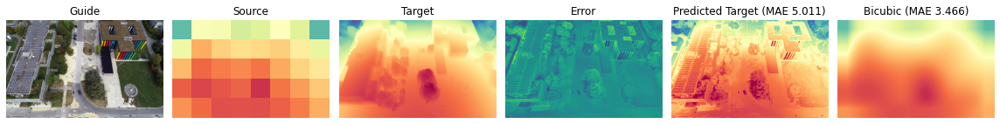

MSE: 49.518  ---  MAE: 5.011  ---  PBP: 0.825



####### image 19/25 - image idx 18 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[386.51364   68.82705   67.94092   66.09109   70.44683   67.79951
  74.19504   76.95599   75.51781   75.747826  80.5659    78.344604
  83.10999   82.87975   75.71583   79.68745 ]
----------MAE----------
(16,)
[14.174725   5.7588143  5.8359303  5.6572847  5.927879   5.8671737
  6.220504   6.232192   6.196935   6.196337   6.376956   6.371361
  6.4917803  6.518557   6.1835475  6.441475 ]


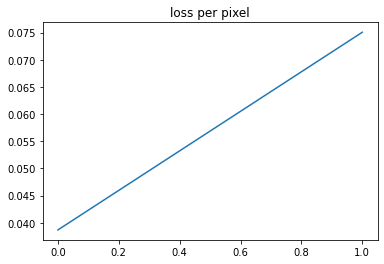

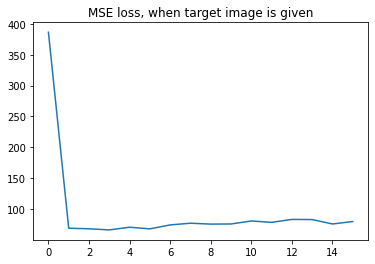

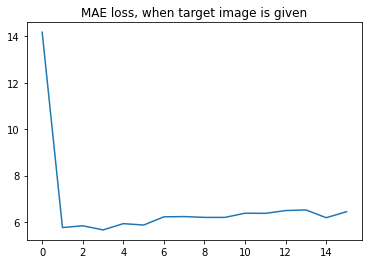

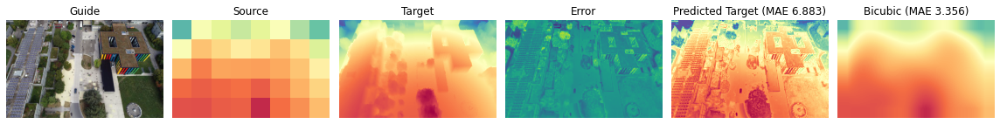

MSE: 90.721  ---  MAE: 6.883  ---  PBP: 0.878



####### image 20/25 - image idx 19 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[343.53815   77.86577   59.880848  69.742065  60.798695  64.31247
  64.54659   64.38773   64.53135   59.02589   59.422737  59.47704
  56.995865  58.04541   58.38588   57.392395]
----------MAE----------
(16,)
[13.87796    6.1357913  5.588475   6.098257   5.6000466  5.768094
  5.8480864  5.85778    5.855293   5.6337314  5.624324   5.6165886
  5.486215   5.4852686  5.603608   5.525716 ]


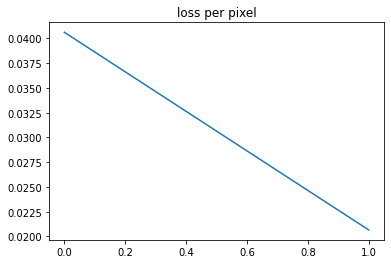

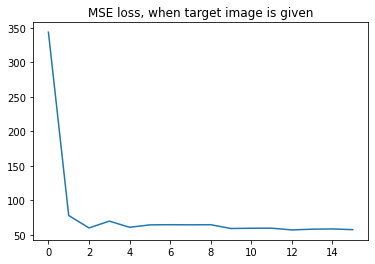

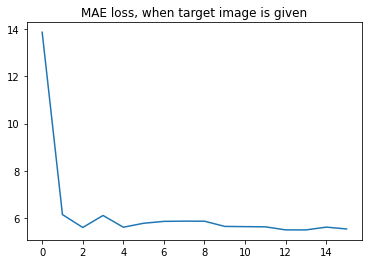

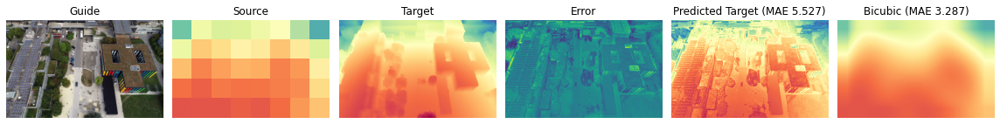

MSE: 58.391  ---  MAE: 5.527  ---  PBP: 0.840



####### image 21/25 - image idx 20 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[412.51547  184.82132  126.94536  111.68403   97.00025   89.199455
  96.47329   78.531876  91.42758   86.0262    77.93041   78.573555
  84.257744  87.05381   83.94699   81.27316 ]
----------MAE----------
(16,)
[15.881321   8.339239   7.1479893  6.885108   6.822508   6.583668
  6.468152   6.0734158  6.609099   6.52865    6.262072   6.28593
  6.4615774  6.6926947  6.5338883  6.532981 ]


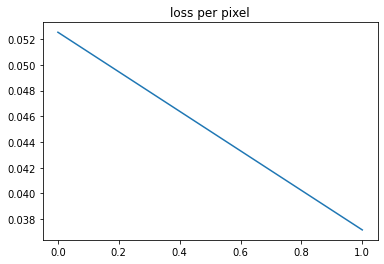

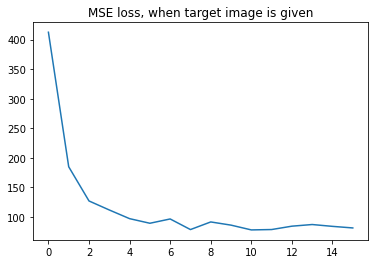

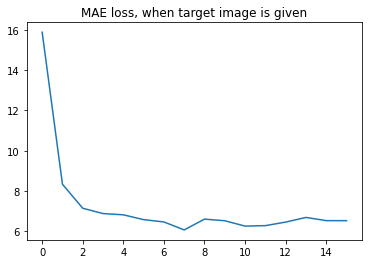

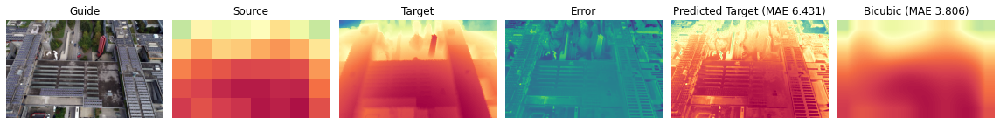

MSE: 77.451  ---  MAE: 6.431  ---  PBP: 0.874



####### image 22/25 - image idx 21 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[611.6569    97.747665 101.46172   93.826805  93.52022   82.96057
  81.090546  89.693535  85.1838    82.006645  80.331154  80.432655
  87.29034   74.80583   79.77189   75.13434 ]
----------MAE----------
(16,)
[18.088627   7.3178554  7.547687   6.9990945  7.0168066  6.440041
  6.284525   6.608704   6.4121313  6.285203   6.150024   6.1373096
  6.3855186  5.8044944  6.0656705  5.849861 ]


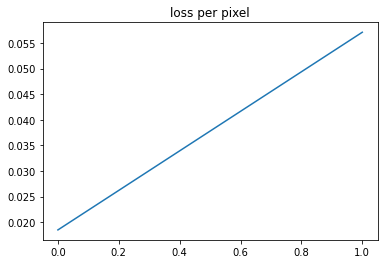

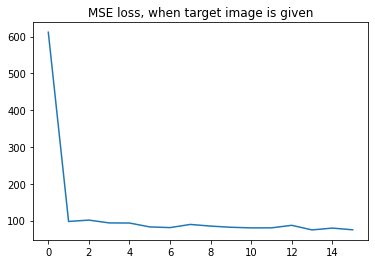

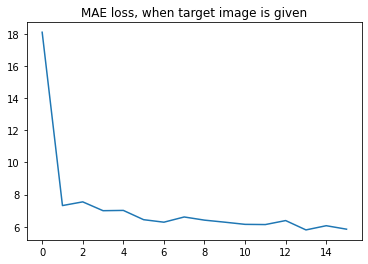

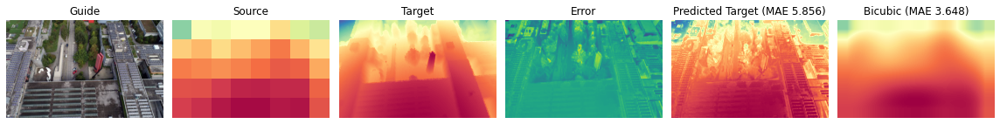

MSE: 75.480  ---  MAE: 5.856  ---  PBP: 0.811



####### image 23/25 - image idx 22 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[446.86044  115.13842   88.0753   100.37054  102.77273  108.96365
 102.69615  105.06924  108.471214 104.52997  102.177765 109.427895
 102.82495   98.45857  100.45405  100.96034 ]
----------MAE----------
(16,)
[17.614674   7.8173375  6.614713   6.888499   7.08153    7.2021813
  7.088662   7.214822   7.252878   7.1472936  7.1034646  7.442926
  7.0995116  7.018937   7.0501685  7.071069 ]


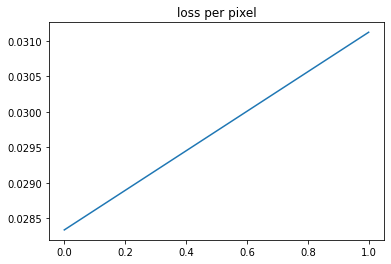

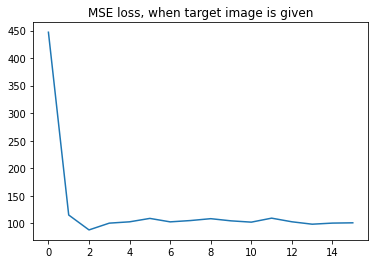

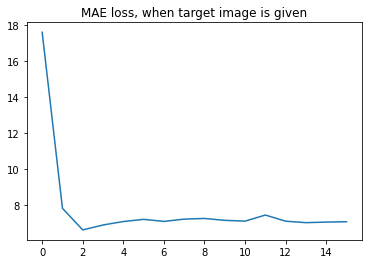

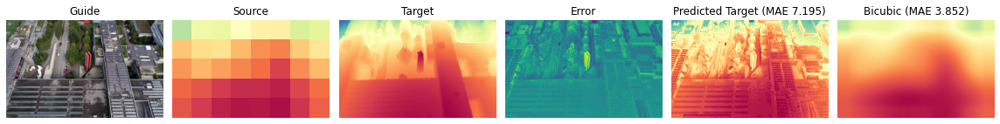

MSE: 104.267  ---  MAE: 7.195  ---  PBP: 0.862



####### image 24/25 - image idx 23 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[449.01355   63.51801   67.61503   54.329704  71.27346   62.410217
  72.1434    65.79907   75.17766   74.34901   68.92411   73.61969
  74.59117   72.36086   78.353264  78.55134 ]
----------MAE----------
(16,)
[16.79866    6.235575   6.2190833  5.409927   6.361261   5.791129
  6.373765   5.899682   6.4123325  6.317859   6.142814   6.3408136
  6.368055   6.2044067  6.4853334  6.4946227]


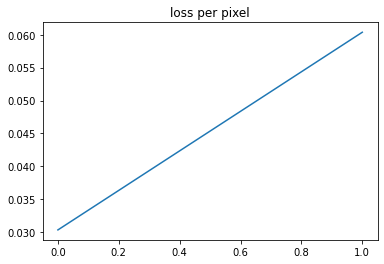

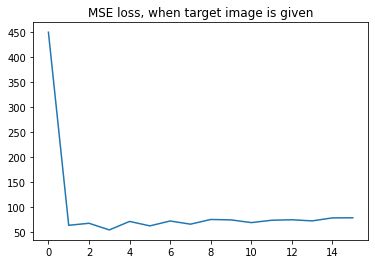

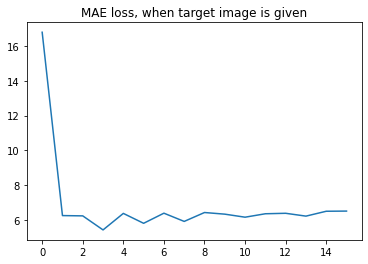

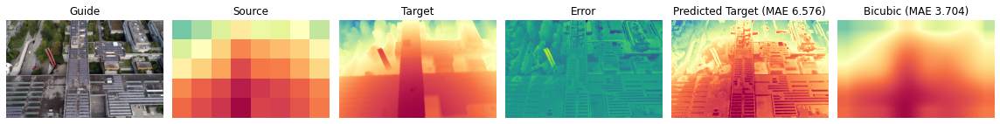

MSE: 78.981  ---  MAE: 6.576  ---  PBP: 0.883



####### image 25/25 - image idx 24 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[440.78036   42.169502  40.68738   45.087135  50.35119   57.87923
  57.598717  56.042927  67.10611   74.65639   78.14147   70.95865
  76.13379   82.53413   79.16299   82.29497 ]
----------MAE----------
(16,)
[16.895514   4.814857   4.692736   4.880478   5.1632357  5.6644917
  5.4869547  5.3968005  6.098102   6.343384   6.4966516  6.217368
  6.4514737  6.7126746  6.60739    6.6360416]


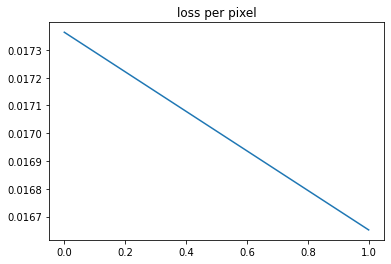

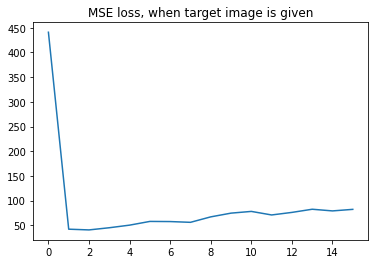

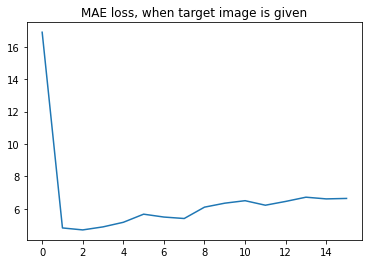

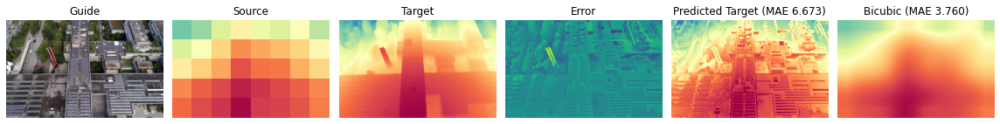

MSE: 81.343  ---  MAE: 6.673  ---  PBP: 0.916





In [12]:
####  define parameters  ########################################################
params = {'img_idxs' : [], # idx images to process, if empty then all of them
            
          'scaling': 90,
          'greyscale': False, # Turn image into grey-scale
          'channels': -1,
          
          'spatial_features_input': True,
          'weights_regularizer': [0.0001, 0.001, 0.0001], # spatial color head
          'loss': 'l1',
 
          'optim': 'adam',
          'lr': 0.001,
                  
          'batch_size': 32,
          'iteration': 1024*5*8//32,
                  
          'logstep': 64,
          
          'final_TGV' : False, # Total Generalized Variation in post-processing
          'align': False, # Move image around for evaluation in case guide image and target image are not perfectly aligned
          'delta_PBP': 1, # Delta for percentage of bad pixels 
         }

if len(params['img_idxs'])==0:
    idxs = np.array(range(0,new_target_imgs.shape[0]))
else:
    idxs = params['img_idxs']

constant = 50
    
for n_image,idx in enumerate(idxs):
    
    print("####### image {}/{} - image idx {} ########".format(n_image+1,len(idxs),idx))
    
    guide_img = new_guide_imgs[idx]
    target_img = new_target_imgs[idx]
    source_img = downsample(target_img,params['scaling'])
    save_path = directory+'/saved_model_EPFL_oblique/model'+str(constant + idx)+'.pt'
    # check if the directory exist
    os.makedirs(os.path.dirname(save_path),exist_ok=True)
    
    bicubic_target_img = bicubic(source_img=source_img, scaling_factor=params['scaling'])
    
    predicted_target_img = PixTransform(guide_img=guide_img,source_img=source_img,params=params,target_img=target_img, path = save_path)
    


    if params['final_TGV'] :
        print("applying TGV...")
        predicted_target_img = tvgen(predicted_target_img,[0.1, 0.1],[1, 2],[1, 1])
        
    if params['align'] :
        print("aligning...")
        target_img,predicted_target_img = align_images(target_img,predicted_target_img)

    f, ax = plot_result(guide_img,source_img,predicted_target_img,bicubic_target_img,target_img)
    plt.show()
    
    if target_img is not None:
        # compute metrics and plot results
        MSE = np.mean((predicted_target_img - target_img) ** 2)
        MAE = np.mean(np.abs(predicted_target_img - target_img))
        PBP = np.mean(np.abs(predicted_target_img - target_img) > params["delta_PBP"])

        print("MSE: {:.3f}  ---  MAE: {:.3f}  ---  PBP: {:.3f}".format(MSE,MAE,PBP))
        print("\n\n")
 